# Projet 8 : Traitez les images pour le système embarqué d’une voiture autonome

## Contexte

Vous êtes ingénieur IA chez "Future Vision Transport", une entreprise qui conçoit des systèmes embarqués de vision par ordinateur pour les véhicules autonomes.

Notre mission est de concevoir un premier modèle de segmentation d’images basé sur le framework Keras.

Ce modèle devra être déployé via une API FastAPI sur le Cloud Azure pour qu'il soit utilisé par les collègues du système de décision.

Cette API prendra en entrée une image et renvoie le mask prédit (segments prédits de l’image).

Enfin il faudra concevoir une interface web Streamlit et la déployer sur le Cloud Azure pour tester l’API et afficher les images et masks.

## Contenu des données du jeu de données Cityscapes :

2 dossiers **gtFine** et **leftImg8bit** contenant chacun les images séparés en données de train, val et test. Dans ces trois dossiers, les images sont divisées selon les différentes villes.

- **gtFine/** :

  **_gtFine_color.png* : contient les couleurs des classes de segmentation;
  
  **_gtFine_instanceIds.png* : contient les identifiants d'instance (objets de la même classe mais distincts : chacun a son numero d'instance unique);
  
  **_gtFine_labalIds.png* : contient les identifiants d'étiquette (chaque pixel contient son identifiant de classe);
  
  **_gtFine_polygons.json* : contient les formes des polygones (forme des objets);

- **leftImg8bit/** : les images brutes du jeu de données (photos de rue en RVB).


## Librairies utilisées avec le langage Python :

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install git+https://github.com/qubvel/segmentation_models

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/qubvel/segmentation_models to c:\users\celin\appdata\local\temp\pip-req-build-arze8807
  Resolved https://github.com/qubvel/segmentation_models to commit 5d24bbfb28af6134e25e2c0b79e7727f6c0491d0
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached Keras_Applications-1.0.8-py3-none-any.whl.metadata (1.7 kB)
  Using cached image_classifiers-1.0.0-py3-none-any.whl.metadata (8.6 kB)
  Using cached efficientnet-1.1.1-py3-none-any.whl.metadata (6.4 kB)
  Using cached scikit_image-0.25.2-cp312-cp312-win_amd64.whl.metadata (14 kB)
  Using cached imageio-2.37.0-py3-none-any.whl.metadata (5.2 kB)
  Using cached lazy_loader-0.4-py3-none-any.whl.metadata (7.6 kB)
Using cached efficientnet-1.1.1-py3-none-any.whl (18 kB)
Using cached image_classifiers-1.0.0-py3-none-any.whl (19 kB)
Using cached Keras_Applications-1.0.8-py3-none-any

  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/segmentation_models 'C:\Users\celin\AppData\Local\Temp\pip-req-build-arze8807'
  Running command git submodule update --init --recursive -q

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\celin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
pip install plot_keras_history

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for plot_keras_history: filename=plot_keras_history-1.1.39-py3-none-any.whl size=10702 sha256=c831a2f6aaaa6f892b8b4515fa8e4e0acf78d5a42d4183ba5c4d5673aeed4527
  Stored in directory: c:\users\celin\appdata\local\pip\cache\wheels\03\3e\64\c18638ae75cbffd7c5aaf2abef32fa6050c060b4fde0c0bef6
  Created wheel for sanitize_ml_labels: filename=sanitize_ml_labels-1.1.4-py3-none-any.whl size=324316 sha256=cb08bc8d5a261011e3943a8e3f83c6e2b01b2f2bdc9924bc404918af1e582e92
  Stored in directory: c:\users\celin\appdata\local\pip\cache\wheels\5c\64\72\7d3cf6d961a77d1bdd8486046f45c1eb4a3516b570f7258e29
  Create


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\celin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
pip install mlflow pyngrok


Defaulting to user installation because normal site-packages is not writeable
  Using cached click-8.2.1-py3-none-any.whl.metadata (2.5 kB)
  Using cached fastapi-0.115.12-py3-none-any.whl.metadata (27 kB)
  Using cached werkzeug-3.1.3-py3-none-any.whl.metadata (3.7 kB)
  Using cached starlette-0.46.2-py3-none-any.whl.metadata (6.2 kB)
  Using cached annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
  Using cached pydantic_core-2.33.2-cp312-cp312-win_amd64.whl.metadata (6.9 kB)
  Using cached typing_inspection-0.4.1-py3-none-any.whl.metadata (2.6 kB)
  Using cached cachetools-5.5.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached pyasn1_modules-0.4.2-py3-none-any.whl.metadata (3.5 kB)
  Using cached rsa-4.9.1-py3-none-any.whl.metadata (5.6 kB)
  Using cached pyasn1-0.6.1-py3-none-any.whl.metadata (8.4 kB)
   ---------------------------------------- 0.0/24.7 MB ? eta -:--:--
   - -------------------------------------- 0.8/24.7 MB 3.7 MB/s eta 0:00:07
   -- -----------------------


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\celin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\celin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [ ]:
import os
import sys
sys.path.append('/content/drive/MyDrive/Colab_Notebooks/P8')

from DataGenerator import DataGenerator

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
import json
import shutil
import zipfile
import glob
import subprocess
import webbrowser
import time
import albumentations as A
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.applications import VGG16
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
from plot_keras_history import show_history, plot_history
from sklearn.metrics import classification_report, confusion_matrix, jaccard_score, f1_score
from itertools import product
import mlflow
import mlflow.sklearn
import mlflow.tensorflow
import mlflow.pytorch
import mlflow.keras
from mlflow.tracking import MlflowClient
import threading
from pyngrok import ngrok
from datetime import datetime
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

ModuleNotFoundError: No module named 'cv2'

In [ ]:
import mlflow
import mlflow.sklearn
import mlflow.tensorflow
import mlflow.pytorch
import mlflow.keras
from mlflow.tracking import MlflowClient
import threading
from pyngrok import ngrok
import subprocess
import time

In [ ]:
# Lancement MLFlow
!fuser -k 5000/tcp #tue les processus du port 5000

local_path = "/content/drive/MyDrive/Colab_Notebooks/P8/mlruns"
os.makedirs(local_path,exist_ok=True)
mlflow.set_tracking_uri(f"file:{local_path}")
mlflow.set_experiment("UNET")

'fuser' n'est pas reconnu en tant que commande interne
ou externe, un programme ex‚cutable ou un fichier de commandes.
2025/06/13 18:18:57 INFO mlflow.tracking.fluent: Experiment with name 'UNET' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:C:/content/drive/MyDrive/Colab_Notebooks/P8/mlruns/450521314594176577', creation_time=1749831537665, experiment_id='450521314594176577', last_update_time=1749831537665, lifecycle_stage='active', name='UNET', tags={}>

In [ ]:
!lsof -i :5000


## Données image:

### Gestion locale

In [ ]:
# Copier le zip en local
zip_path_in = '/content/drive/MyDrive/Colab_Notebooks/P8/Data.zip'
zip_path_out = '/content/Data.zip'
shutil.copy(zip_path_in, zip_path_out)

# Décompresser le zip
temp_path = '/content/temp'
os.makedirs(temp_path, exist_ok=True)
with zipfile.ZipFile(zip_path_out, 'r') as zip_ref:
  zip_ref.extractall(temp_path)

print(f'Fichier dézippé dans {temp_path}')


Fichier dézippé dans /content/temp


In [ ]:
# Liste d'images et de masques appairés pour le jeu de train
image_paths_train = sorted(glob.glob('/content/temp/Data/leftImg8bit/train/*/*.png',recursive=True))

images_list_train = []
masks_list_train = []

for img_path_train in image_paths_train:
    # Reconstituer le chemin du masque
    filename = os.path.basename(img_path_train)
    city = os.path.basename(os.path.dirname(img_path_train))

    mask_filename = filename.replace('leftImg8bit', 'gtFine_labelIds')

    # Construire le chemin complet vers le masque
    mask_path_train = os.path.join('/content/temp/Data/gtFine/train', city, mask_filename)

    if os.path.exists(mask_path_train):
        images_list_train.append(img_path_train)
        masks_list_train.append(mask_path_train)
    else:
        print(f"ATTENTION: Masque manquant pour {img_path_train}")

print(f"Total images train : {len(images_list_train)}")
print(f"Total masques train : {len(masks_list_train)}")

Total images train : 2975
Total masques train : 2975


In [ ]:
# Liste d'images et de masques appairés pour le jeu de validation
image_paths_val = sorted(glob.glob('/content/temp/Data/leftImg8bit/val/*/*.png',recursive=True))

images_list_val = []
masks_list_val = []

for img_path_val in image_paths_val:
    # Reconstituer le chemin du masque
    filename = os.path.basename(img_path_val)
    city = os.path.basename(os.path.dirname(img_path_val))

    mask_filename = filename.replace('leftImg8bit', 'gtFine_labelIds')

    # Construire le chemin complet vers le masque
    mask_path_val = os.path.join('/content/temp/Data/gtFine/val', city, mask_filename)

    if os.path.exists(mask_path_val):
        images_list_val.append(img_path_val)
        masks_list_val.append(mask_path_val)
    else:
        print(f"ATTENTION: Masque manquant pour {img_path_val}")

print(f"Total images val : {len(images_list_val)}")
print(f"Total masques val : {len(masks_list_val)}")

Total images val : 500
Total masques val : 500


### Data Generator

#### Pour from scratch

In [ ]:
# Pipeline d'augmentations
my_augmentations = A.Compose([
    A.HorizontalFlip(p=0.5), #miroir horizontal avec une proba de 50%
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.0, rotate_limit=1, p=0.5),
    A.Resize(224, 224),  # Remettre à la taille souhaitée après crop
])

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [ ]:
# Utilisation du DataGenerator pour le jeu de données de train avec data augmentation
train_generator_aug = DataGenerator(
    images_list=images_list_train,
    masks_list=masks_list_train,
    batch_size=8,
    image_size=(224, 224),
    augmentations=my_augmentations,
    shuffle=True,  #Uniquement pour l'entrainement
    encoder=None
)

# Visualisation du premier batch :
X_batch_train_aug, y_batch_train_aug = train_generator_aug[0]

print(X_batch_train_aug.shape)  # (batch_size, 224, 224, 3)
print(y_batch_train_aug.shape)  # (batch_size, 224, 224, 8)


(16, 224, 224, 3)
(16, 224, 224, 8)


In [ ]:
# Utilisation du DataGenerator pour le jeu de données de train sans data augmentation
train_generator = DataGenerator(
    images_list=images_list_train,
    masks_list=masks_list_train,
    batch_size=16,
    image_size=(224, 224),
    augmentations=None,
    shuffle=True,  #Uniquement pour l'entrainement
    encoder=None
)

# Visualisation du premier batch :
X_batch_train, y_batch_train = train_generator[0]

print(X_batch_train.shape)  # (batch_size, 224, 224, 3)
print(y_batch_train.shape)  # (batch_size, 224, 224, 8)

(16, 224, 224, 3)
(16, 224, 224, 8)


In [ ]:
# Utilisation du DataGenerator pour le jeu de données de validation
val_generator = DataGenerator(
    images_list=images_list_val,
    masks_list=masks_list_val,
    batch_size=16,
    image_size=(224, 224),
    augmentations=None,
    shuffle=False,  #Uniquement pour l'entrainement
    encoder=None
)

# Visualisation du premier batch :
X_batch_val, y_batch_val = val_generator[0]

print(X_batch_val.shape)  # (batch_size, 224, 224, 3)
print(y_batch_val.shape)  # (batch_size, 224, 224, 8)

(16, 224, 224, 3)
(16, 224, 224, 8)


#### Pour VGG16

In [ ]:
# Utilisation du DataGenerator pour le jeu de données de train avec data augmentation
train_generator_aug_vgg16 = DataGenerator(
    images_list=images_list_train,
    masks_list=masks_list_train,
    batch_size=4,
    image_size=(224, 224),
    augmentations=my_augmentations,
    shuffle=True,  #Uniquement pour l'entrainement
    encoder='vgg16'
)

# Visualisation du premier batch :
X_batch_train_aug_vgg16, y_batch_train_aug_vgg16 = train_generator_aug_vgg16[0]

print(X_batch_train_aug_vgg16.shape)  # (batch_size, 224, 224, 3)
print(y_batch_train_aug_vgg16.shape)  # (batch_size, 224, 224, 8)

(8, 224, 224, 3)
(8, 224, 224, 8)


In [ ]:
# Utilisation du DataGenerator pour le jeu de données de train sans data augmentation
train_generator_vgg16 = DataGenerator(
    images_list=images_list_train,
    masks_list=masks_list_train,
    batch_size=8,
    image_size=(224, 224),
    augmentations=None,
    shuffle=True,  #Uniquement pour l'entrainement
    encoder='vgg16'
)

# Visualisation du premier batch :
X_batch_train_vgg16, y_batch_train_vgg16 = train_generator_vgg16[0]

print(X_batch_train_vgg16.shape)  # (batch_size, 224, 224, 3)
print(y_batch_train_vgg16.shape)  # (batch_size, 224, 224, 8)

(8, 224, 224, 3)
(8, 224, 224, 8)


In [ ]:
# Utilisation du DataGenerator pour le jeu de données de validation
val_generator_vgg16 = DataGenerator(
    images_list=images_list_val,
    masks_list=masks_list_val,
    batch_size=8,
    image_size=(224, 224),
    augmentations=None,
    shuffle=False,  #Uniquement pour l'entrainement
    encoder='vgg16'
)

# Visualisation du premier batch :
X_batch_val_vgg16, y_batch_val_vgg16 = val_generator_vgg16[0]

print(X_batch_val_vgg16.shape)  # (batch_size, 224, 224, 3)
print(y_batch_val_vgg16.shape)  # (batch_size, 224, 224, 8)

(8, 224, 224, 3)
(8, 224, 224, 8)


### Segmentation avec U-Net

Papier de référence :

"U-net: Convolutional networks for biomedical image segmentation" ; O Ronneberger, P Fischer, T Brox ; Medical image computing and computer-assisted intervention–MICCAI, 2015

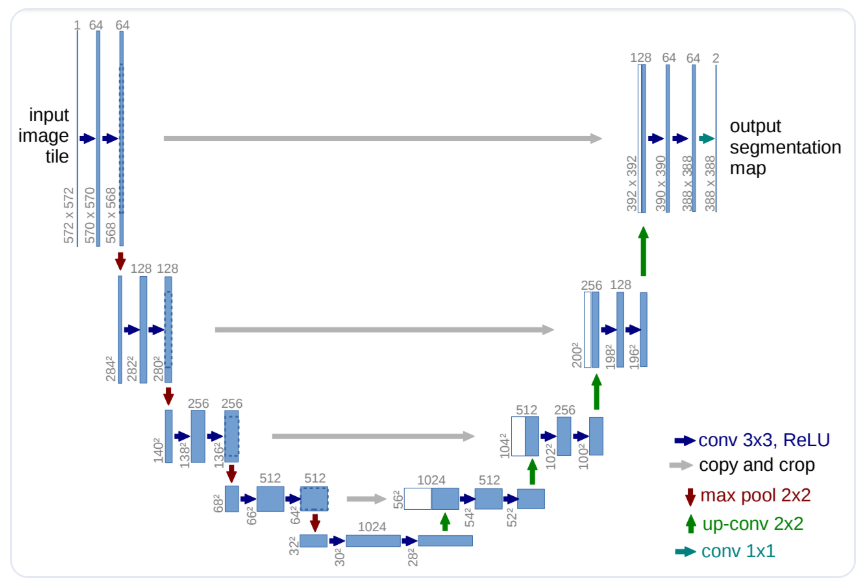

Le modèle U-Net est un réseau de neurones convolutif (CNN) utilisé pour la segmentation sémantique d’images, particulièrement efficace pour les tâches où chaque pixel de l’image doit être classé.

Il doit son nom à sa forme en U, qui reflète sa structure en deux parties : un encodeur (ou chemin contractant) et un décodeur (ou chemin expansif), reliés par des connexions de type skip connections.

- Encodeur :

Ce bloc extrait progressivement des caractéristiques de haut niveau.

Chaque niveau contient deux convolutions 3x3 (avec ReLU) suivies d’un max pooling 2x2 qui réduit la dimension spatiale.

Le nombre de canaux de caractéristiques augmente à chaque descente (64 → 128 → 256 ... ).

But : capturer le contexte de l’image.

- Couche centrale (bottleneck) :     

La partie la plus profonde du réseau : elle a une vision très globale de l’image (petite dimension spatiale, grande profondeur).

Deux convolutions 3x3 suivies d'une opération d'up-convolution (transposée ou upsampling) pour entamer le décodage.

- Décodeur :    

Chaque niveau remonte en double taille spatiale via une up-convolution 2x2 (flèche verte).

Cette carte de caractéristiques est concaténée avec celle correspondante de l'encodeur (skip connection, flèche grise).

Puis deux convolutions 3x3 avec ReLU affinent les détails.

Le nombre de canaux diminue progressivement (... 256 → 128 → 64).

- Couche de sortie :

Une convolution 1x1 (flèche turquoise) produit la carte de segmentation avec autant de canaux que de classes.

La sortie est donc une carte de probabilité par pixel.


- Les skip connections :

Permettent de réutiliser les caractéristiques fines de la descente pour améliorer la précision spatiale à la remontée.



In [ ]:
def build_unet(backbone=None, input_shape=(224, 224, 3), num_classes=8, filters=[32, 64],
               dropout_rate=0.0, optimizer='adam', learning_rate=1e-3, loss='dice'):
    """
    Crée un modèle U-Net avec ou sans backbone pré-entraîné (supporte Dropout même avec backbone).
    Args:
        backbone (str or None): nom du backbone (ex: 'vgg16', 'resnet34') ou None
        input_shape (tuple): taille des images en entrée
        num_classes (int): nombre de classes (ex : 8 pour Cityscapes)
        filters (list): nombre de filtres pour chaque couche convolutive
        dropout_rate (float): taux de dropout pour éviter le surapprentissage
        optimizer (str): optimiseur pour la compilation du modèle ('adam', 'sgd')
        learning_rate (float): taux d'apprentissage pour l'optimiseur
        loss (str): fonction de perte pour la compilation du modèle ('dice', 'categorical_crossentropy','focal','focal_dice')

    Returns:
        tf.keras.Model: modèle U-Net
    """

    if backbone == 'vgg16':
        # --- ENCODER: VGG16 ---
        vgg = VGG16(include_top=False, weights='imagenet', input_shape=input_shape)
        vgg.trainable = False  # encoder figé

        inputs = vgg.input
        skips = [
            vgg.get_layer("block1_conv2").output,  # 112x112
            vgg.get_layer("block2_conv2").output,  # 56x56
            vgg.get_layer("block3_conv3").output,  # 28x28
            vgg.get_layer("block4_conv3").output   # 14x14
        ]
        x = vgg.get_layer("block5_conv3").output  # 7x7

        # --- DECODER avec Dropout ---
        for i, skip in reversed(list(enumerate(skips))):
            x = layers.UpSampling2D((2, 2))(x)
            x = layers.Concatenate()([x, skip])
            x = layers.Conv2D(512 // (2**i), 3, activation='relu', padding='same')(x)
            x = layers.Conv2D(512 // (2**i), 3, activation='relu', padding='same')(x)
            if dropout_rate > 0.0:
                x = layers.Dropout(dropout_rate)(x)

        outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(x)
        base_model = models.Model(inputs, outputs)

    elif backbone:  # Autres backbones via segmentation_models
        base_model = sm.Unet(
            backbone_name=backbone,
            input_shape=input_shape,
            classes=num_classes,
            activation='softmax',
            encoder_weights='imagenet'
            # Attention : pas de support officiel pour decoder_dropout ici
        )

    else:
        # U-Net from scratch
        inputs = tf.keras.Input(shape=input_shape, name='image_input')

        # Encoder dynamique
        skips = []
        x = inputs
        for f in filters:
            x = layers.Conv2D(f, 3, activation='relu', padding='same')(x)
            x = layers.Conv2D(f, 3, activation='relu', padding='same')(x)
            skips.append(x)
            x = layers.MaxPooling2D((2, 2))(x)
            if dropout_rate > 0.0:
                x = layers.Dropout(dropout_rate)(x)

        # Bottleneck
        x = layers.Conv2D(filters[-1]*2, 3, activation='relu', padding='same')(x)
        x = layers.Conv2D(filters[-1]*2, 3, activation='relu', padding='same')(x)

        # Decoder
        for i in reversed(range(len(filters))):
            x = layers.UpSampling2D((2, 2))(x)
            x = layers.Concatenate()([x, skips[i]])
            x = layers.Conv2D(filters[i], 3, activation='relu', padding='same')(x)
            x = layers.Conv2D(filters[i], 3, activation='relu', padding='same')(x)

        outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(x)
        base_model = models.Model(inputs=inputs, outputs=outputs)

    # --- Loss ---
    if loss == 'dice':
        loss_fn = sm.losses.DiceLoss()
    elif loss == 'ce':
        loss_fn = 'categorical_crossentropy'
    elif loss == 'focal':
        loss_fn = sm.losses.CategoricalFocalLoss()
    elif loss == 'focal_dice':
        loss_fn = sm.losses.categorical_focal_dice_loss
    else:
        raise ValueError("Loss inconnue")

    # --- Optimizer ---
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        opt = SGD(learning_rate=learning_rate, momentum=0.9)
    else:
        raise ValueError("Optimiseur non reconnu")

    base_model.compile(optimizer=opt, loss=loss_fn,
                       metrics=[sm.metrics.IOUScore(threshold=0.5), 'accuracy'])

    return base_model


Ici nous utilisons une version un peu plus moderne en utilisant un padding pour préserver les dimensions spatiales. Les skip connections sont donc juste une concaténation directe et non plus un "crop and copy".

Au vu des temps d'entrainement très longs, pour toutes les configurations testées ci-après, nous testerons plusieurs hyperparamètres différents sur 5 epochs puis, avec les meilleurs, nous effectuerons un entrainement complet sur 50 epochs.

La métrique prioritaire pour le choix des meilleurs hyperparamètres sera le
Frequency Weighted IoU (FWIoU), enregistré comme mean_iou_weighted dans MLflow.
C'est une métrique avancée pour l’évaluation de la segmentation sémantique, qui permet de prendre en compte l'importance relative des classes en fonction de leur fréquence dans les données, ce qui donne une vision plus "réaliste" de la performance sur les classes majoritaires. Il est particulièrement pertinent quand les classes sont très déséquilibrées.

#### U-Net from Scratch sans Data Augmentation

-----------------------------------------------------------------------------
UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice
Epoch 1/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.4400 - iou_score: 0.1031 - loss: 0.8332
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.61529, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1810s 10s/step - accuracy: 0.4406 - iou_score: 0.1038 - loss: 0.8326 - val_accuracy: 0.6712 - val_iou_score: 0.3332 - val_loss: 0.6153 - learning_rate: 1.0000e-04
Epoch 2/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.6990 - iou_score: 0.3894 - loss: 0.5438
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.61529 to 0.53464, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1799s 10s/step - accuracy: 0.6990 - iou_score: 0.3895 - loss: 0.5438 - val_accuracy: 0.7156 - val_iou_score: 0.4001 - val_loss: 0.5346 - learning_rate: 1.0000e-04
Epoch 3/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7311 - iou_score: 0.4331 - loss: 0.4966
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.53464 to 0.49314, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1762s 10s/step - accuracy: 0.7311 - iou_score: 0.4331 - loss: 0.4965 - val_accuracy: 0.7412 - val_iou_score: 0.4352 - val_loss: 0.4931 - learning_rate: 1.0000e-04
Epoch 4/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7615 - iou_score: 0.4743 - loss: 0.4513
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.49314 to 0.47062, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1777s 10s/step - accuracy: 0.7615 - iou_score: 0.4744 - loss: 0.4512 - val_accuracy: 0.7526 - val_iou_score: 0.4551 - val_loss: 0.4706 - learning_rate: 1.0000e-04
Epoch 5/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7811 - iou_score: 0.5014 - loss: 0.4215
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.47062 to 0.46287, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1786s 10s/step - accuracy: 0.7811 - iou_score: 0.5014 - loss: 0.4214 - val_accuracy: 0.7692 - val_iou_score: 0.4626 - val_loss: 0.4629 - learning_rate: 1.0000e-04


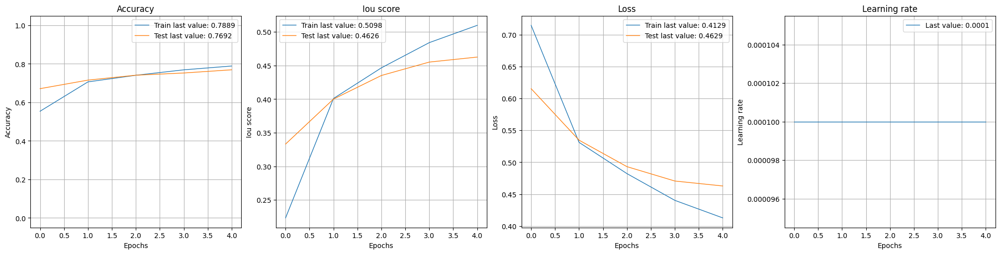

31/31 ━━━━━━━━━━━━━━━━━━━━ 250s 8s/step


2025/06/06 16:20:59 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/06 16:21:17 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmp_fezr0ne/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/06 16:21:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneNONE_UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice' already exists. Creating a new version of this model...
Created version '3' of model 'UNET_backboneNO

-----------------------------------------------------------------------------
UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice
Epoch 1/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.4516 - iou_score: 0.1079 - loss: 0.8302
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.69283, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1809s 10s/step - accuracy: 0.4521 - iou_score: 0.1085 - loss: 0.8296 - val_accuracy: 0.5605 - val_iou_score: 0.2628 - val_loss: 0.6928 - learning_rate: 1.0000e-04
Epoch 2/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7036 - iou_score: 0.3904 - loss: 0.5479
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.69283 to 0.57294, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1774s 10s/step - accuracy: 0.7036 - iou_score: 0.3905 - loss: 0.5478 - val_accuracy: 0.7050 - val_iou_score: 0.3717 - val_loss: 0.5729 - learning_rate: 1.0000e-04
Epoch 3/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7383 - iou_score: 0.4391 - loss: 0.4908
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.57294 to 0.52550, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1796s 10s/step - accuracy: 0.7383 - iou_score: 0.4391 - loss: 0.4907 - val_accuracy: 0.7176 - val_iou_score: 0.4051 - val_loss: 0.5255 - learning_rate: 1.0000e-04
Epoch 4/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7637 - iou_score: 0.4753 - loss: 0.4495
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.52550 to 0.47128, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1813s 10s/step - accuracy: 0.7637 - iou_score: 0.4754 - loss: 0.4495 - val_accuracy: 0.7589 - val_iou_score: 0.4566 - val_loss: 0.4713 - learning_rate: 1.0000e-04
Epoch 5/5
185/185 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7869 - iou_score: 0.5030 - loss: 0.4197
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.47128 to 0.45441, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


185/185 ━━━━━━━━━━━━━━━━━━━━ 1788s 10s/step - accuracy: 0.7869 - iou_score: 0.5030 - loss: 0.4197 - val_accuracy: 0.7689 - val_iou_score: 0.4686 - val_loss: 0.4544 - learning_rate: 1.0000e-04


<Figure size 640x480 with 0 Axes>

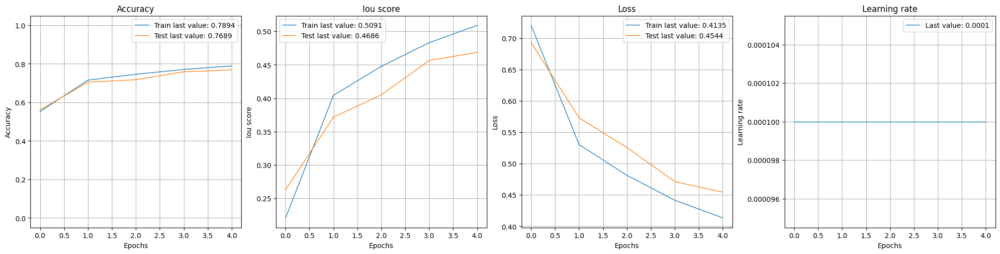

31/31 ━━━━━━━━━━━━━━━━━━━━ 252s 8s/step


2025/06/06 19:04:47 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/06 19:05:08 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpumehdej4/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/06 19:05:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneNONE_UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice' already exists. Creating a new version of this model...
Created version '4' of model 'UNET_backboneNO

Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.


<ipython-input-21-10e20d577758>:200: FutureWarning: ``mlflow.tracking.client.MlflowClient.transition_model_version_stage`` is deprecated since 2.9.0. Model registry stages will be removed in a future major release. To learn more about the deprecation of model registry stages, see our migration guide here: https://mlflow.org/docs/latest/model-registry.html#migrating-from-stages
  client.transition_model_version_stage(


<Figure size 640x480 with 0 Axes>

In [ ]:
# Hyperparamètres à tester
# filters=[[32,64],[64,128],[64,128,256]]
# dropout_rate_list=[0.0,0.3,0.5]
# optimizer_list=['adam','sgd']
# learning_rate_list=[1e-3,1e-4]
# loss_list=['dice', 'categorical_crossentropy','focal','focal_dice']
filter=[64,128,256]
dropout_rate_list=[0.3,0.5]
optimizer='adam'
learning_rate=1e-4
loss='focal_dice'

best_val_iou = 0
epochs_total = 5

# Créer un dossier pour sauvegarder les checkpoints
checkpoint_dir_base = "/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints"
os.makedirs(checkpoint_dir_base, exist_ok=True)

for  dropout_rate in dropout_rate_list :
    # Nom de la run + checkpoint
    run_name = f"UNET_backboneNONE_filter{filter}_dropout_rate{dropout_rate}_optimizer{optimizer}_learning_rate{learning_rate}_loss{loss}"
    run_checkpoint_dir = os.path.join(checkpoint_dir_base, run_name)
    os.makedirs(run_checkpoint_dir, exist_ok=True)

    path_last = os.path.join(run_checkpoint_dir, "last_weights.h5")
    path_best = os.path.join(run_checkpoint_dir, "best_weights.h5")
    path_epoch = os.path.join(run_checkpoint_dir, "epoch.json")

    # Créer le modèle
    model = build_unet(
        backbone=None,
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

    # Si un checkpoint existe, reprendre
    initial_epoch = 0
    if os.path.exists(path_last):
        model.load_weights(path_last)
        if os.path.exists(path_epoch):
            with open(path_epoch, "r") as f:
                epoch_data = json.load(f)
                initial_epoch = epoch_data.get("epoch", 0) + 1
        print(f"[INFO] Reprise depuis epoch {initial_epoch}")

    # Enregistrement avec MLflow
    with mlflow.start_run(experiment_id='364163698965296690', run_name=run_name):
        mlflow.log_param("filter", filter)
        mlflow.log_param("dropout_rate", dropout_rate)
        mlflow.log_param("optimizer", optimizer)
        mlflow.log_param("learning_rate", learning_rate)
        mlflow.log_param("loss", loss)

        class EpochSaver(tf.keras.callbacks.Callback):
            def on_epoch_end(self, epoch, logs=None):
                with open(path_epoch, "w") as f:
                    json.dump({"epoch": epoch}, f)

        # Checkpoint qui sauvegarde le meilleur modèle (selon val_loss)
        checkpoint_last = ModelCheckpoint(path_last, save_best_only=False, verbose=1)
        checkpoint_best = ModelCheckpoint(path_best, monitor='val_loss', save_best_only=True, verbose=1)
        early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

        callbacks_list = [checkpoint_last, checkpoint_best, early_stopping, reduce_lr, EpochSaver()]

        print("-----------------------------------------------------------------------------")
        print(f"{run_name}")

        history = model.fit(
            train_generator,
            validation_data=val_generator,
            epochs=epochs_total,
            initial_epoch=initial_epoch,
            callbacks=callbacks_list
        )

        # Charge les meilleurs poids avant test
        model.load_weights(path_best)

        # Courbe d'entrainement et de validation
        if history.history.get("loss"):  # Vérifie qu'on a des données
            show_history(history)
            plot_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{run_name}.png"
            plot_history(history, path=plot_path)
            mlflow.log_artifact(plot_path)
            plt.close()
            # Journalisation des métriques dans MLflow
            mlflow.log_metric("final_train_accuracy", history.history['accuracy'][-1])
            mlflow.log_metric("final_val_accuracy", history.history['val_accuracy'][-1])
            mlflow.log_metric("final_train_loss", history.history['loss'][-1])
            mlflow.log_metric("final_val_loss", history.history['val_loss'][-1])
        else:
            print("[INFO] Aucun nouvel entraînement effectué, courbes non générées.")

        # Évaluation
        scores = model.evaluate(val_generator, verbose=0)
        val_iou = scores[1]

        mlflow.log_metric("test_loss", scores[0])
        mlflow.log_metric("test_iou", scores[1])
        mlflow.log_metric("test_accuracy", scores[2])

        # Réinitialisation du générateur si nécessaire
        val_generator.on_epoch_end()
        # test_generator.reset()

        # Prédictions
        y_pred = model.predict(val_generator)
        y_pred_classes = np.argmax(y_pred, axis=-1)

        # Vérités terrain
        y_true = []
        for i in range(len(val_generator)):
            _, batch_y = val_generator[i]
            y_true.append(batch_y)
        y_true = np.concatenate(y_true, axis=0)
        y_true_classes = np.argmax(y_true, axis=-1)

        # Aplatir les tableaux
        y_pred_flat = y_pred_classes.flatten()
        y_true_flat = y_true_classes.flatten()

        # Calculs des IoU
        iou_per_class = jaccard_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)), zero_division=0)
        mean_iou = jaccard_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)), zero_division=0)
        weighted_iou = jaccard_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)), zero_division=0)

        # Log dans MLflow
        for i, iou in enumerate(iou_per_class):
            mlflow.log_metric(f"iou_class_{i}", iou)
        mlflow.log_metric("mean_iou_macro", mean_iou)
        mlflow.log_metric("mean_iou_weighted", weighted_iou)

        # --- Dice global : sur tous les pixels ---
        dice_global = f1_score(y_true_flat, y_pred_flat, average='micro', labels=list(range(8)))
        mlflow.log_metric("dice_global", dice_global)

        # --- Dice macro : moyenne simple sur les classes ---
        dice_macro = f1_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)))
        mlflow.log_metric("dice_macro", dice_macro)

        # --- Dice pondéré : moyenne pondérée selon la fréquence des classes ---
        dice_weighted = f1_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)))
        mlflow.log_metric("dice_weighted", dice_weighted)

        # --- Dice par classe ---
        dice_per_class = f1_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)))
        for i, dice in enumerate(dice_per_class):
            mlflow.log_metric(f"dice_class_{i}", dice)

        # Matrice de confusion
        conf_matrix = confusion_matrix(y_true_flat, y_pred_flat, labels=range(8))
        plt.figure(figsize=(8,6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
        plt.xlabel("Prédictions")
        plt.ylabel("Réels")
        plt.title("Matrice de confusion")
        cm_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/conf_matrix_{run_name}.png"
        plt.savefig(cm_path)
        mlflow.log_artifact(cm_path)
        plt.close()

        # Enregistrement du modèle
        mlflow.tensorflow.log_model(model, run_name)
        if val_iou > best_val_iou:
            best_val_iou = val_iou
            best_model_name = run_name
            model.save(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{best_model_name}.h5")
            plt.savefig(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")
            mlflow.log_artifact(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")

        model_uri = f"runs:/{mlflow.active_run().info.run_id}/UNET_backboneNONE"
        mlflow.register_model(model_uri=model_uri, name=f"UNET_backboneNONE_{run_name}")

        client = MlflowClient()
        latest_version = client.get_latest_versions(f"UNET_backboneNONE_{run_name}", stages=[])[-1]

        # Ajouter une description lisible
        client.update_model_version(
            name=f"UNET_backboneNONE_{run_name}",
            version=latest_version.version,
            description=f"IOU: {val_iou:.3f} | {datetime.today().date()}"
        )

        # Ajouter des tags utiles
        client.set_model_version_tag(
            name=f"UNET_backboneNONE_{run_name}",
            version=latest_version.version,
            key="IOU",
            value=str(round(val_iou, 3))
        )

        client.transition_model_version_stage(
            name=f"UNET_backboneNONE_{run_name}",
            version=latest_version.version,
            stage="Staging"
        )

print("Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.")


In [ ]:
def decode_segmentation_mask(mask_2d):
    """
    Convertit un masque 2D (avec classes de 0 à 7) en image RGB colorée pour visualisation.
    """
    # Couleurs (R, G, B) pour chaque classe (tu peux changer selon tes goûts)
    colors = {
        0: (0, 0, 0),         # void - noir
        1: (128, 64, 128),    # flat - violet
        2: (70, 70, 70),      # construction - gris
        3: (255, 0, 0),       # object - rouge
        4: (0, 128, 0),       # nature - vert
        5: (70, 130, 180),    # sky - bleu ciel
        6: (220, 20, 60),     # human - rose
        7: (0, 0, 142),       # vehicle - bleu foncé
    }

    h, w = mask_2d.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_id, color in colors.items():
        rgb_mask[mask_2d == class_id] = color
    return rgb_mask

In [ ]:
def visualize_prediction(model, generator, num_images=3):
    """
    Affiche les prédictions du modèle avec superposition des masques (réels et prédits).
    """
    for i in range(num_images):
        # Charger le batch i
        image_batch, mask_batch = generator[i]
        original_images, original_masks = generator.get_original_images_and_masks(index=i)

        # On prend le premier élément du batch
        preprocessed_img = image_batch[0]
        true_mask_onehot = mask_batch[0]
        original_img = original_images[0]
        original_mask = original_masks[0]

        # Prédiction
        prediction = model.predict(np.expand_dims(preprocessed_img, axis=0))[0]
        pred_mask = np.argmax(prediction, axis=-1)
        true_mask = np.argmax(true_mask_onehot, axis=-1)

        # Masques colorés
        pred_rgb = decode_segmentation_mask(pred_mask)
        true_rgb = decode_segmentation_mask(true_mask)

        # Superpositions
        overlay_pred = cv2.addWeighted(original_img, 0.6, pred_rgb, 0.4, 0)
        overlay_true = cv2.addWeighted(original_img, 0.6, true_rgb, 0.4, 0)

        # Affichage
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        axes[0].imshow(original_img)
        axes[0].set_title("Image originale")

        axes[1].imshow(true_rgb)
        axes[1].set_title("Masque réel")

        axes[2].imshow(pred_rgb)
        axes[2].set_title("Masque prédit")

        axes[3].imshow(overlay_pred)
        axes[3].set_title("Overlay (prédiction)")

        for ax in axes:
            ax.axis("off")

        plt.tight_layout()
        plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


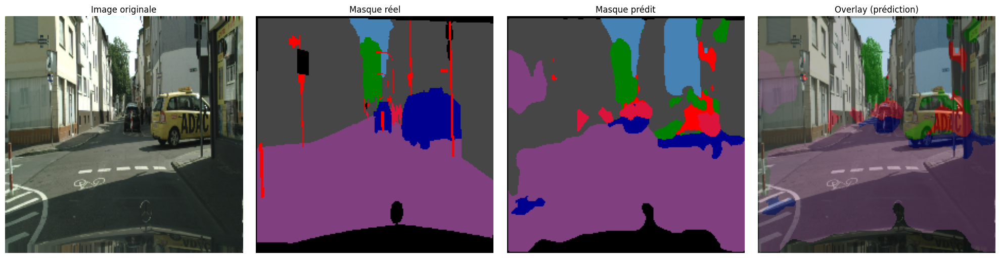

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


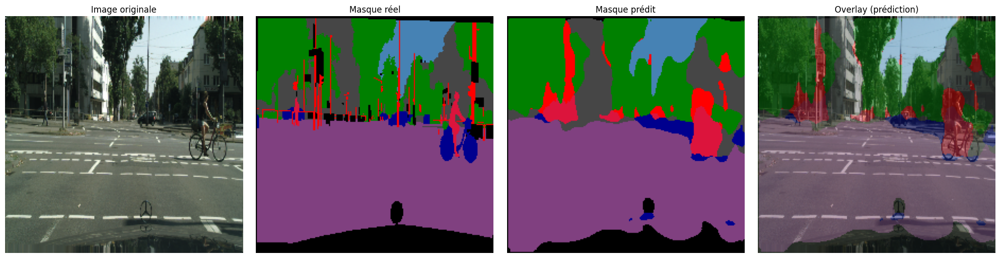

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


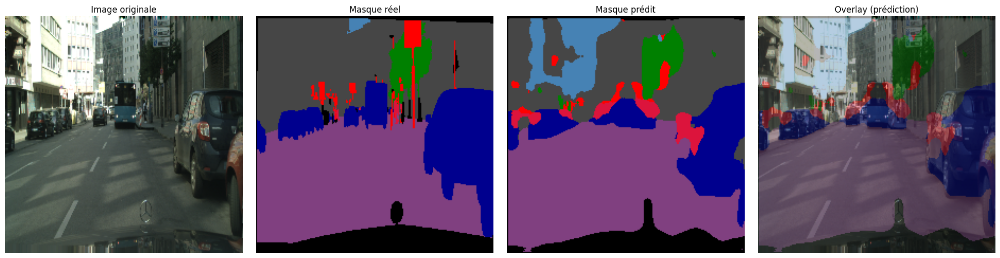

In [ ]:
# Reconstruction du meilleur modèle Unet from scratch sans data augmentation via MLflow, avec les mêmes paramètres
filter=[64,128,256]
dropout_rate=0.5
optimizer='adam'
learning_rate=0.0001
loss='focal_dice'
model = build_unet(
        backbone=None,
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

# Chargement des poids enregistrés de ce modèle
model_path=f"/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5"
model.load_weights(model_path)

# Visualisation
visualize_prediction(model, val_generator, num_images=3)


#### U-Net from Scratch avec Data Augmentation

-----------------------------------------------------------------------------
UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice
Epoch 1/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.4853 - iou_score: 0.1627 - loss: 0.7765
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.53910, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2007s 5s/step - accuracy: 0.4856 - iou_score: 0.1631 - loss: 0.7761 - val_accuracy: 0.7115 - val_iou_score: 0.3899 - val_loss: 0.5391 - learning_rate: 1.0000e-04
Epoch 2/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7271 - iou_score: 0.4261 - loss: 0.5022
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.53910 to 0.46672, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 1940s 5s/step - accuracy: 0.7271 - iou_score: 0.4261 - loss: 0.5021 - val_accuracy: 0.7584 - val_iou_score: 0.4600 - val_loss: 0.4667 - learning_rate: 1.0000e-04
Epoch 3/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7729 - iou_score: 0.4903 - loss: 0.4339
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.46672 to 0.43553, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 1976s 5s/step - accuracy: 0.7729 - iou_score: 0.4903 - loss: 0.4339 - val_accuracy: 0.7654 - val_iou_score: 0.4867 - val_loss: 0.4355 - learning_rate: 1.0000e-04
Epoch 4/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7942 - iou_score: 0.5198 - loss: 0.4010
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.43553 to 0.39784, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 1978s 5s/step - accuracy: 0.7942 - iou_score: 0.5198 - loss: 0.4010 - val_accuracy: 0.8018 - val_iou_score: 0.5230 - val_loss: 0.3978 - learning_rate: 1.0000e-04
Epoch 5/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8145 - iou_score: 0.5509 - loss: 0.3684
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.39784 to 0.37953, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2016s 5s/step - accuracy: 0.8145 - iou_score: 0.5509 - loss: 0.3684 - val_accuracy: 0.8105 - val_iou_score: 0.5386 - val_loss: 0.3795 - learning_rate: 1.0000e-04


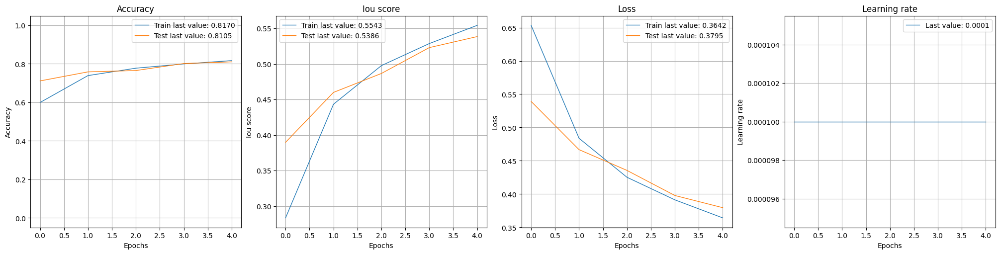

31/31 ━━━━━━━━━━━━━━━━━━━━ 267s 8s/step


2025/06/06 22:21:26 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/06 22:21:45 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpkujqhjxu/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/06 22:21:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneNONE_UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice' already exists. Creating a new version of this model...
Created version '3' of model 'UNET_backbo

-----------------------------------------------------------------------------
UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice
Epoch 1/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.4732 - iou_score: 0.1719 - loss: 0.7688
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.56646, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2003s 5s/step - accuracy: 0.4736 - iou_score: 0.1722 - loss: 0.7685 - val_accuracy: 0.6908 - val_iou_score: 0.3729 - val_loss: 0.5665 - learning_rate: 1.0000e-04
Epoch 2/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7080 - iou_score: 0.4102 - loss: 0.5208
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.56646 to 0.52839, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 1973s 5s/step - accuracy: 0.7080 - iou_score: 0.4103 - loss: 0.5208 - val_accuracy: 0.7170 - val_iou_score: 0.4040 - val_loss: 0.5284 - learning_rate: 1.0000e-04
Epoch 3/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7544 - iou_score: 0.4657 - loss: 0.4602
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.52839 to 0.44448, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 1973s 5s/step - accuracy: 0.7544 - iou_score: 0.4657 - loss: 0.4601 - val_accuracy: 0.7709 - val_iou_score: 0.4806 - val_loss: 0.4445 - learning_rate: 1.0000e-04
Epoch 4/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.7839 - iou_score: 0.5059 - loss: 0.4175
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.44448 to 0.44444, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 1963s 5s/step - accuracy: 0.7839 - iou_score: 0.5060 - loss: 0.4174 - val_accuracy: 0.7786 - val_iou_score: 0.4824 - val_loss: 0.4444 - learning_rate: 1.0000e-04
Epoch 5/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8034 - iou_score: 0.5345 - loss: 0.3863
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.44444 to 0.39892, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2016s 5s/step - accuracy: 0.8034 - iou_score: 0.5346 - loss: 0.3862 - val_accuracy: 0.7889 - val_iou_score: 0.5237 - val_loss: 0.3989 - learning_rate: 1.0000e-04


<Figure size 640x480 with 0 Axes>

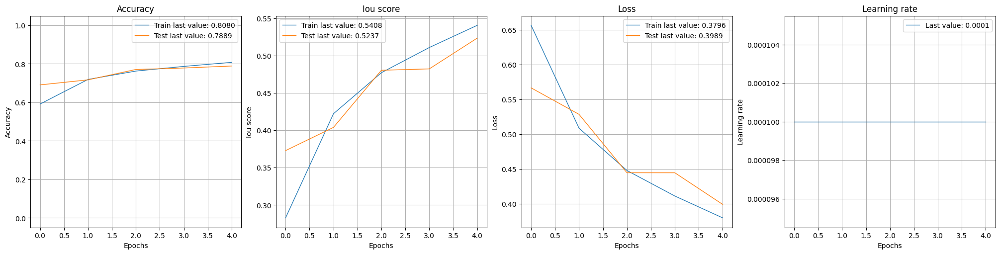

31/31 ━━━━━━━━━━━━━━━━━━━━ 267s 9s/step


2025/06/07 01:22:45 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/07 01:23:07 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpmb6df6q2/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/07 01:23:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneNONE_UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate0.0001_lossfocal_dice' already exists. Creating a new version of this model...
Created version '2' of model 'UNET_backbo

-----------------------------------------------------------------------------
UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice
Epoch 1/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.3657 - iou_score: 0.0501 - loss: 0.8936
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.73868, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2255s 6s/step - accuracy: 0.3659 - iou_score: 0.0503 - loss: 0.8934 - val_accuracy: 0.5364 - val_iou_score: 0.2103 - val_loss: 0.7387 - learning_rate: 1.0000e-05
Epoch 2/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.5949 - iou_score: 0.2741 - loss: 0.6705
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.73868 to 0.62682, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2363s 6s/step - accuracy: 0.5950 - iou_score: 0.2741 - loss: 0.6704 - val_accuracy: 0.6541 - val_iou_score: 0.3221 - val_loss: 0.6268 - learning_rate: 1.0000e-05
Epoch 3/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6580 - iou_score: 0.3531 - loss: 0.5894
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.62682 to 0.60851, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2366s 6s/step - accuracy: 0.6580 - iou_score: 0.3532 - loss: 0.5894 - val_accuracy: 0.6611 - val_iou_score: 0.3418 - val_loss: 0.6085 - learning_rate: 1.0000e-05
Epoch 4/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6781 - iou_score: 0.3779 - loss: 0.5607
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.60851 to 0.58786, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2347s 6s/step - accuracy: 0.6781 - iou_score: 0.3780 - loss: 0.5607 - val_accuracy: 0.6789 - val_iou_score: 0.3567 - val_loss: 0.5879 - learning_rate: 1.0000e-05
Epoch 5/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6908 - iou_score: 0.3915 - loss: 0.5449
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.58786 to 0.57095, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2292s 6s/step - accuracy: 0.6908 - iou_score: 0.3915 - loss: 0.5449 - val_accuracy: 0.6913 - val_iou_score: 0.3704 - val_loss: 0.5709 - learning_rate: 1.0000e-05


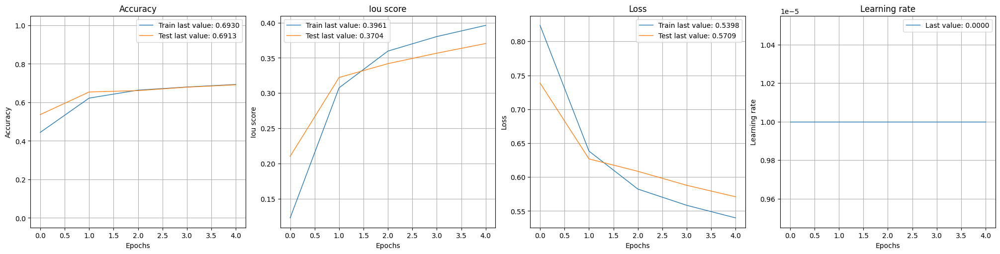

31/31 ━━━━━━━━━━━━━━━━━━━━ 312s 10s/step


2025/06/07 04:53:48 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/07 04:54:10 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpgzi1io40/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/07 04:54:10 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Successfully registered model 'UNET_backboneNONE_UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice'.
Created version '1' of model 'UNET_backboneNONE_UNET_backboneNONE_AUG_filter[64, 128

-----------------------------------------------------------------------------
UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice
Epoch 1/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.3776 - iou_score: 0.0558 - loss: 0.8874
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.77016, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2318s 6s/step - accuracy: 0.3778 - iou_score: 0.0559 - loss: 0.8873 - val_accuracy: 0.5138 - val_iou_score: 0.1926 - val_loss: 0.7702 - learning_rate: 1.0000e-05
Epoch 2/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.5687 - iou_score: 0.2517 - loss: 0.7033
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.77016 to 0.66441, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2308s 6s/step - accuracy: 0.5688 - iou_score: 0.2518 - loss: 0.7032 - val_accuracy: 0.6092 - val_iou_score: 0.3054 - val_loss: 0.6644 - learning_rate: 1.0000e-05
Epoch 3/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6516 - iou_score: 0.3447 - loss: 0.6061
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.66441 to 0.63570, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2302s 6s/step - accuracy: 0.6516 - iou_score: 0.3448 - loss: 0.6061 - val_accuracy: 0.6194 - val_iou_score: 0.3176 - val_loss: 0.6357 - learning_rate: 1.0000e-05
Epoch 4/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6699 - iou_score: 0.3638 - loss: 0.5739

In [ ]:
# Hyperparamètres à tester
# filters=[[32,64],[64,128],[64,128,256]]
# dropout_rate_list=[0.0,0.3,0.5]
# optimizer_list=['adam','sgd']
# learning_rate_list=[1e-3,1e-4, 1e-5]
# loss_list=['dice', 'categorical_crossentropy','focal','focal_dice']
filter=[64,128,256]
dropout_rate_list=[0.3,0.5]
optimizer='adam'
learning_rate_list=[1e-4, 1e-5]
loss='focal_dice'

best_val_iou = 0
epochs_total = 5

# Créer un dossier pour sauvegarder les checkpoints
checkpoint_dir_base = "/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints"
os.makedirs(checkpoint_dir_base, exist_ok=True)

for learning_rate,dropout_rate in product(learning_rate_list,dropout_rate_list) :
    # Nom de la run + checkpoint
    run_name = f"UNET_backboneNONE_AUG_filter{filter}_dropout_rate{dropout_rate}_optimizer{optimizer}_learning_rate{learning_rate}_loss{loss}"
    run_checkpoint_dir = os.path.join(checkpoint_dir_base, run_name)
    os.makedirs(run_checkpoint_dir, exist_ok=True)

    path_last = os.path.join(run_checkpoint_dir, "last_weights.h5")
    path_best = os.path.join(run_checkpoint_dir, "best_weights.h5")
    path_epoch = os.path.join(run_checkpoint_dir, "epoch.json")

    # Créer le modèle
    model = build_unet(
        backbone=None,
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

    # Si un checkpoint existe, reprendre
    initial_epoch = 0
    if os.path.exists(path_last):
        model.load_weights(path_last)
        if os.path.exists(path_epoch):
            with open(path_epoch, "r") as f:
                epoch_data = json.load(f)
                initial_epoch = epoch_data.get("epoch", 0) + 1
        print(f"[INFO] Reprise depuis epoch {initial_epoch}")

    # Enregistrement avec MLflow
    with mlflow.start_run(experiment_id='364163698965296690', run_name=run_name):
        mlflow.log_param("filter", filter)
        mlflow.log_param("dropout_rate", dropout_rate)
        mlflow.log_param("optimizer", optimizer)
        mlflow.log_param("learning_rate", learning_rate)
        mlflow.log_param("loss", loss)

        class EpochSaver(tf.keras.callbacks.Callback):
            def on_epoch_end(self, epoch, logs=None):
                with open(path_epoch, "w") as f:
                    json.dump({"epoch": epoch}, f)

        # Checkpoint qui sauvegarde le meilleur modèle (selon val_loss)
        checkpoint_last = ModelCheckpoint(path_last, save_best_only=False, verbose=1)
        checkpoint_best = ModelCheckpoint(path_best, monitor='val_loss', save_best_only=True, verbose=1)
        early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
        reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

        callbacks_list = [checkpoint_last, checkpoint_best, early_stopping, reduce_lr, EpochSaver()]

        print("-----------------------------------------------------------------------------")
        print(f"{run_name}")

        history = model.fit(
            train_generator_aug,
            validation_data=val_generator,
            epochs=epochs_total,
            initial_epoch=initial_epoch,
            callbacks=callbacks_list
        )

        # Charge les meilleurs poids avant test
        model.load_weights(path_best)

        # Courbe d'entrainement et de validation
        if history.history.get("loss"):  # Vérifie qu'on a des données
            show_history(history)
            plot_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{run_name}.png"
            plot_history(history, path=plot_path)
            mlflow.log_artifact(plot_path)
            plt.close()
            # Journalisation des métriques dans MLflow
            mlflow.log_metric("final_train_accuracy", history.history['accuracy'][-1])
            mlflow.log_metric("final_val_accuracy", history.history['val_accuracy'][-1])
            mlflow.log_metric("final_train_loss", history.history['loss'][-1])
            mlflow.log_metric("final_val_loss", history.history['val_loss'][-1])
        else:
            print("[INFO] Aucun nouvel entraînement effectué, courbes non générées.")

        # Évaluation
        scores = model.evaluate(val_generator, verbose=0)
        val_iou = scores[1]

        mlflow.log_metric("test_loss", scores[0])
        mlflow.log_metric("test_iou", scores[1])
        mlflow.log_metric("test_accuracy", scores[2])

        # Réinitialisation du générateur si nécessaire
        val_generator.on_epoch_end()
        # test_generator.reset()

        # Prédictions
        y_pred = model.predict(val_generator)
        y_pred_classes = np.argmax(y_pred, axis=-1)

        # Vérités terrain
        y_true = []
        for i in range(len(val_generator)):
            _, batch_y = val_generator[i]
            y_true.append(batch_y)
        y_true = np.concatenate(y_true, axis=0)
        y_true_classes = np.argmax(y_true, axis=-1)

        # Aplatir les tableaux
        y_pred_flat = y_pred_classes.flatten()
        y_true_flat = y_true_classes.flatten()

        # Calculs des IoU
        iou_per_class = jaccard_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)), zero_division=0)
        mean_iou = jaccard_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)), zero_division=0)
        weighted_iou = jaccard_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)), zero_division=0)

        # Log dans MLflow
        for i, iou in enumerate(iou_per_class):
            mlflow.log_metric(f"iou_class_{i}", iou)
        mlflow.log_metric("mean_iou_macro", mean_iou)
        mlflow.log_metric("mean_iou_weighted", weighted_iou)

        # --- Dice global : sur tous les pixels ---
        dice_global = f1_score(y_true_flat, y_pred_flat, average='micro', labels=list(range(8)))
        mlflow.log_metric("dice_global", dice_global)

        # --- Dice macro : moyenne simple sur les classes ---
        dice_macro = f1_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)))
        mlflow.log_metric("dice_macro", dice_macro)

        # --- Dice pondéré : moyenne pondérée selon la fréquence des classes ---
        dice_weighted = f1_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)))
        mlflow.log_metric("dice_weighted", dice_weighted)

        # --- Dice par classe ---
        dice_per_class = f1_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)))
        for i, dice in enumerate(dice_per_class):
            mlflow.log_metric(f"dice_class_{i}", dice)

        # Matrice de confusion
        conf_matrix = confusion_matrix(y_true_flat, y_pred_flat, labels=range(8))
        plt.figure(figsize=(8,6))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
        plt.xlabel("Prédictions")
        plt.ylabel("Réels")
        plt.title("Matrice de confusion")
        cm_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/conf_matrix_{run_name}.png"
        plt.savefig(cm_path)
        mlflow.log_artifact(cm_path)
        plt.close()

        # Enregistrement du modèle
        mlflow.tensorflow.log_model(model, run_name)
        if val_iou > best_val_iou:
            best_val_iou = val_iou
            best_model_name = run_name
            model.save(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{best_model_name}.h5")
            plt.savefig(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")
            mlflow.log_artifact(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")

        model_uri = f"runs:/{mlflow.active_run().info.run_id}/UNET_backboneNONE"
        mlflow.register_model(model_uri=model_uri, name=f"UNET_backboneNONE_{run_name}")

        client = MlflowClient()
        latest_version = client.get_latest_versions(f"UNET_backboneNONE_{run_name}", stages=[])[-1]

        # Ajouter une description lisible
        client.update_model_version(
            name=f"UNET_backboneNONE_{run_name}",
            version=latest_version.version,
            description=f"IOU: {val_iou:.3f} | {datetime.today().date()}"
        )

        # Ajouter des tags utiles
        client.set_model_version_tag(
            name=f"UNET_backboneNONE_{run_name}",
            version=latest_version.version,
            key="IOU",
            value=str(round(val_iou, 3))
        )

        client.transition_model_version_stage(
            name=f"UNET_backboneNONE_{run_name}",
            version=latest_version.version,
            stage="Staging"
        )

print("Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


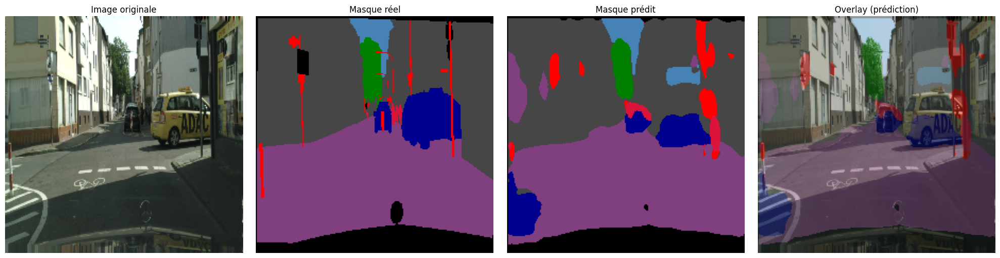

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


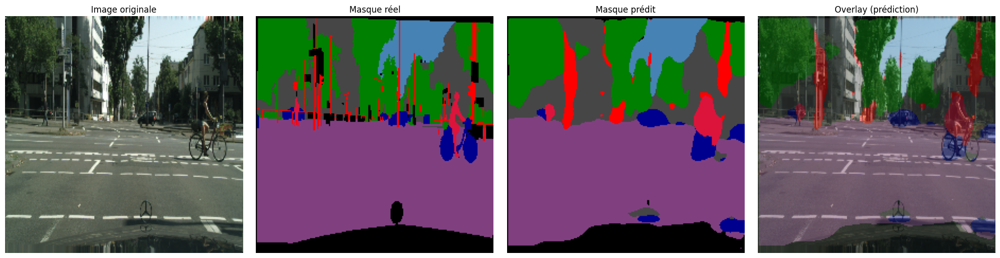

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


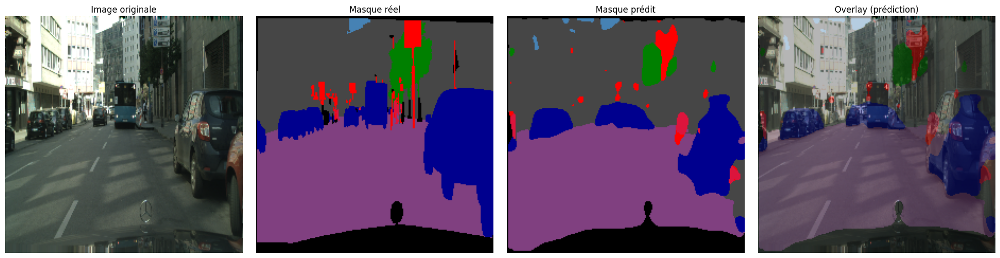

In [ ]:
# Reconstruction du meilleur modèle Unet from scratch sans data augmentation via MLflow, avec les mêmes paramètres
filter=[64,128,256]
dropout_rate=0.3
optimizer='adam'
learning_rate=0.0001
loss='focal_dice'
model = build_unet(
        backbone=None,
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

# Chargement des poids enregistrés de ce modèle
model_path=f"/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneNONE_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5"
model.load_weights(model_path)

# Visualisation
visualize_prediction(model, val_generator, num_images=3)


#### U-Net avec encodeur VGG16 sans Data Augmentation

-----------------------------------------------------------------------------
UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice
Epoch 1/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.6089 - iou_score: 0.3016 - loss: 0.7896
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.46099, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2053s 5s/step - accuracy: 0.6092 - iou_score: 0.3019 - loss: 0.7891 - val_accuracy: 0.8161 - val_iou_score: 0.5193 - val_loss: 0.4610 - learning_rate: 1.0000e-05
Epoch 2/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8326 - iou_score: 0.5534 - loss: 0.4180
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.46099 to 0.40378, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2036s 5s/step - accuracy: 0.8326 - iou_score: 0.5535 - loss: 0.4179 - val_accuracy: 0.8402 - val_iou_score: 0.5655 - val_loss: 0.4038 - learning_rate: 1.0000e-05
Epoch 3/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8561 - iou_score: 0.6002 - loss: 0.3619
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.40378 to 0.37702, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2052s 6s/step - accuracy: 0.8561 - iou_score: 0.6002 - loss: 0.3619 - val_accuracy: 0.8522 - val_iou_score: 0.5868 - val_loss: 0.3770 - learning_rate: 1.0000e-05
Epoch 4/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8649 - iou_score: 0.6190 - loss: 0.3389
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.37702 to 0.36879, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2073s 6s/step - accuracy: 0.8649 - iou_score: 0.6190 - loss: 0.3389 - val_accuracy: 0.8524 - val_iou_score: 0.5961 - val_loss: 0.3688 - learning_rate: 1.0000e-05
Epoch 5/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8717 - iou_score: 0.6303 - loss: 0.3258
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.36879 to 0.35226, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2085s 5s/step - accuracy: 0.8717 - iou_score: 0.6304 - loss: 0.3258 - val_accuracy: 0.8614 - val_iou_score: 0.6082 - val_loss: 0.3523 - learning_rate: 1.0000e-05


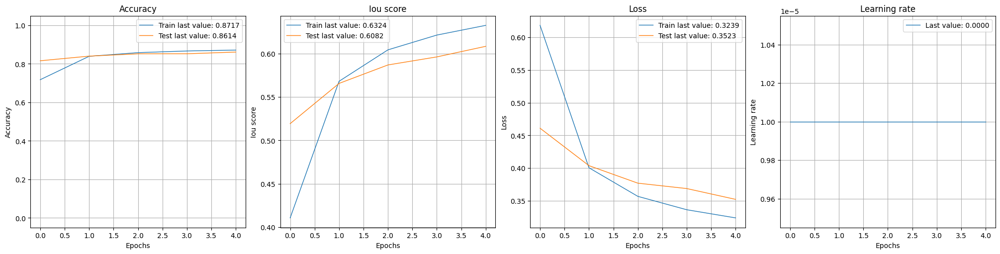

62/62 ━━━━━━━━━━━━━━━━━━━━ 253s 4s/step


2025/06/07 17:44:42 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/07 17:45:00 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmp_wqpxju0/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/07 17:45:00 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneVGG16_UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice' already exists. Creating a new version of this model...
Created version '3' of model 'UNET_backboneV

-----------------------------------------------------------------------------
UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice
Epoch 1/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.5272 - iou_score: 0.2327 - loss: 0.9146
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.52640, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2047s 5s/step - accuracy: 0.5276 - iou_score: 0.2330 - loss: 0.9141 - val_accuracy: 0.8031 - val_iou_score: 0.4739 - val_loss: 0.5264 - learning_rate: 1.0000e-05
Epoch 2/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8145 - iou_score: 0.5130 - loss: 0.4736
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.52640 to 0.42581, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2038s 5s/step - accuracy: 0.8145 - iou_score: 0.5131 - loss: 0.4736 - val_accuracy: 0.8357 - val_iou_score: 0.5506 - val_loss: 0.4258 - learning_rate: 1.0000e-05
Epoch 3/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8440 - iou_score: 0.5735 - loss: 0.3966
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.42581 to 0.39508, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2018s 5s/step - accuracy: 0.8440 - iou_score: 0.5735 - loss: 0.3966 - val_accuracy: 0.8486 - val_iou_score: 0.5728 - val_loss: 0.3951 - learning_rate: 1.0000e-05
Epoch 4/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8566 - iou_score: 0.5979 - loss: 0.3651
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.39508 to 0.38106, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2008s 5s/step - accuracy: 0.8566 - iou_score: 0.5979 - loss: 0.3650 - val_accuracy: 0.8520 - val_iou_score: 0.5837 - val_loss: 0.3811 - learning_rate: 1.0000e-05
Epoch 5/5
371/371 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8626 - iou_score: 0.6117 - loss: 0.3474
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.38106 to 0.37074, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5


371/371 ━━━━━━━━━━━━━━━━━━━━ 2039s 5s/step - accuracy: 0.8626 - iou_score: 0.6117 - loss: 0.3474 - val_accuracy: 0.8557 - val_iou_score: 0.5915 - val_loss: 0.3707 - learning_rate: 1.0000e-05


<Figure size 640x480 with 0 Axes>

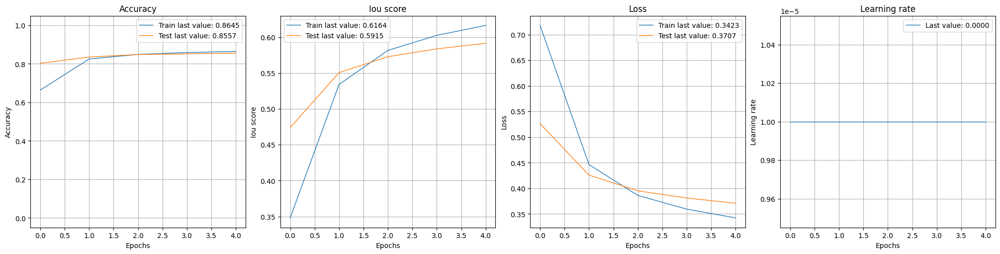

62/62 ━━━━━━━━━━━━━━━━━━━━ 253s 4s/step


2025/06/07 20:48:48 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/07 20:49:05 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmpbupslpow/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/07 20:49:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneVGG16_UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.5_optimizeradam_learning_rate1e-05_lossfocal_dice' already exists. Creating a new version of this model...
Created version '3' of model 'UNET_backboneV

Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.


In [ ]:
# Hyperparamètres à tester
# filters=[[32,64],[64,128],[64,128,256]]
# dropout_rate_list=[0.0,0.3,0.5]
# optimizer_list=['adam','sgd']
# learning_rate_list=[1e-3,1e-4]
# loss_list=['dice', 'categorical_crossentropy','focal','focal_dice']
filter=[64,128,256]
dropout_rate_list=[0.3,0.5]
optimizer='adam'
learning_rate=1e-5
loss='focal_dice'

best_val_iou = 0
epochs_total = 5

# Créer un dossier pour sauvegarder les checkpoints
checkpoint_dir_base = "/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints"
os.makedirs(checkpoint_dir_base, exist_ok=True)

for dropout_rate in  dropout_rate_list :
    # Nom de la run + checkpoint
    run_name = f"UNET_backboneVGG16_filter{filter}_dropout_rate{dropout_rate}_optimizer{optimizer}_learning_rate{learning_rate}_loss{loss}"
    run_checkpoint_dir = os.path.join(checkpoint_dir_base, run_name)
    os.makedirs(run_checkpoint_dir, exist_ok=True)

    path_last = os.path.join(run_checkpoint_dir, "last_weights.h5")
    path_best = os.path.join(run_checkpoint_dir, "best_weights.h5")
    path_epoch = os.path.join(run_checkpoint_dir, "epoch.json")

    # Créer le modèle
    model = build_unet(
      backbone='vgg16',
      input_shape=(224, 224, 3),
      num_classes=8,
      filters=filter,
      dropout_rate=dropout_rate,
      optimizer=optimizer,
      learning_rate=learning_rate,
      loss=loss
    )

    # Si un checkpoint existe, reprendre
    initial_epoch = 0
    if os.path.exists(path_last):
      model.load_weights(path_last)
      if os.path.exists(path_epoch):
          with open(path_epoch, "r") as f:
              epoch_data = json.load(f)
              initial_epoch = epoch_data.get("epoch", 0) + 1
      print(f"[INFO] Reprise depuis epoch {initial_epoch}")

    # Enregistrement avec MLflow
    with mlflow.start_run(experiment_id='364163698965296690', run_name=run_name):
      mlflow.log_param("filter", filter)
      mlflow.log_param("dropout_rate", dropout_rate)
      mlflow.log_param("optimizer", optimizer)
      mlflow.log_param("learning_rate", learning_rate)
      mlflow.log_param("loss", loss)

      class EpochSaver(tf.keras.callbacks.Callback):
          def on_epoch_end(self, epoch, logs=None):
              with open(path_epoch, "w") as f:
                  json.dump({"epoch": epoch}, f)

      # Checkpoint qui sauvegarde le meilleur modèle (selon val_loss)
      checkpoint_last = ModelCheckpoint(path_last, save_best_only=False, verbose=1)
      checkpoint_best = ModelCheckpoint(path_best, monitor='val_loss', save_best_only=True, verbose=1)
      early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
      reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

      callbacks_list = [checkpoint_last, checkpoint_best, early_stopping, reduce_lr, EpochSaver()]

      print("-----------------------------------------------------------------------------")
      print(f"{run_name}")

      history = model.fit(
          train_generator_vgg16,
          validation_data=val_generator_vgg16,
          epochs=epochs_total,
          initial_epoch=initial_epoch,
          callbacks=callbacks_list
      )

      # Charge les meilleurs poids avant test
      model.load_weights(path_best)

      # Courbe d'entrainement et de validation
      if history.history.get("loss"):  # Vérifie qu'on a des données
          show_history(history)
          plot_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{run_name}.png"
          plot_history(history, path=plot_path)
          mlflow.log_artifact(plot_path)
          plt.close()
          # Journalisation des métriques dans MLflow
          mlflow.log_metric("final_train_accuracy", history.history['accuracy'][-1])
          mlflow.log_metric("final_val_accuracy", history.history['val_accuracy'][-1])
          mlflow.log_metric("final_train_loss", history.history['loss'][-1])
          mlflow.log_metric("final_val_loss", history.history['val_loss'][-1])
      else:
          print("[INFO] Aucun nouvel entraînement effectué, courbes non générées.")

      # Évaluation
      scores = model.evaluate(val_generator_vgg16, verbose=0)
      val_iou = scores[1]

      mlflow.log_metric("test_loss", scores[0])
      mlflow.log_metric("test_iou", scores[1])
      mlflow.log_metric("test_accuracy", scores[2])

      # Réinitialisation du générateur si nécessaire
      val_generator_vgg16.on_epoch_end()
      # test_generator.reset()

      # Prédictions
      y_pred = model.predict(val_generator_vgg16)
      y_pred_classes = np.argmax(y_pred, axis=-1)

      # Vérités terrain
      y_true = []
      for i in range(len(val_generator_vgg16)):
          _, batch_y = val_generator_vgg16[i]
          y_true.append(batch_y)
      y_true = np.concatenate(y_true, axis=0)
      y_true_classes = np.argmax(y_true, axis=-1)

      # Aplatir les tableaux
      y_pred_flat = y_pred_classes.flatten()
      y_true_flat = y_true_classes.flatten()

      # Calculs des IoU
      iou_per_class = jaccard_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)), zero_division=0)
      mean_iou = jaccard_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)), zero_division=0)
      weighted_iou = jaccard_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)), zero_division=0)

      # Log dans MLflow
      for i, iou in enumerate(iou_per_class):
          mlflow.log_metric(f"iou_class_{i}", iou)
      mlflow.log_metric("mean_iou_macro", mean_iou)
      mlflow.log_metric("mean_iou_weighted", weighted_iou)

      # --- Dice global : sur tous les pixels ---
      dice_global = f1_score(y_true_flat, y_pred_flat, average='micro', labels=list(range(8)))
      mlflow.log_metric("dice_global", dice_global)

      # --- Dice macro : moyenne simple sur les classes ---
      dice_macro = f1_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)))
      mlflow.log_metric("dice_macro", dice_macro)

      # --- Dice pondéré : moyenne pondérée selon la fréquence des classes ---
      dice_weighted = f1_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)))
      mlflow.log_metric("dice_weighted", dice_weighted)

      # --- Dice par classe ---
      dice_per_class = f1_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)))
      for i, dice in enumerate(dice_per_class):
          mlflow.log_metric(f"dice_class_{i}", dice)

      # Matrice de confusion
      conf_matrix = confusion_matrix(y_true_flat, y_pred_flat, labels=range(8))
      plt.figure(figsize=(8,6))
      sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
      plt.xlabel("Prédictions")
      plt.ylabel("Réels")
      plt.title("Matrice de confusion")
      cm_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/conf_matrix_{run_name}.png"
      plt.savefig(cm_path)
      mlflow.log_artifact(cm_path)
      plt.close()

      # Enregistrement du modèle
      mlflow.tensorflow.log_model(model, run_name)
      if val_iou > best_val_iou:
          best_val_iou = val_iou
          best_model_name = run_name
          model.save(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{best_model_name}.h5")
          plt.savefig(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")
          mlflow.log_artifact(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")

      model_uri = f"runs:/{mlflow.active_run().info.run_id}/UNET_backboneVGG16"
      mlflow.register_model(model_uri=model_uri, name=f"UNET_backboneVGG16_{run_name}")

      client = MlflowClient()
      latest_version = client.get_latest_versions(f"UNET_backboneVGG16_{run_name}", stages=[])[-1]

      # Ajouter une description lisible
      client.update_model_version(
          name=f"UNET_backboneVGG16_{run_name}",
          version=latest_version.version,
          description=f"IOU: {val_iou:.3f} | {datetime.today().date()}"
      )

      # Ajouter des tags utiles
      client.set_model_version_tag(
          name=f"UNET_backboneVGG16_{run_name}",
          version=latest_version.version,
          key="IOU",
          value=str(round(val_iou, 3))
      )

      client.transition_model_version_stage(
          name=f"UNET_backboneVGG16_{run_name}",
          version=latest_version.version,
          stage="Staging"
      )

print("Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


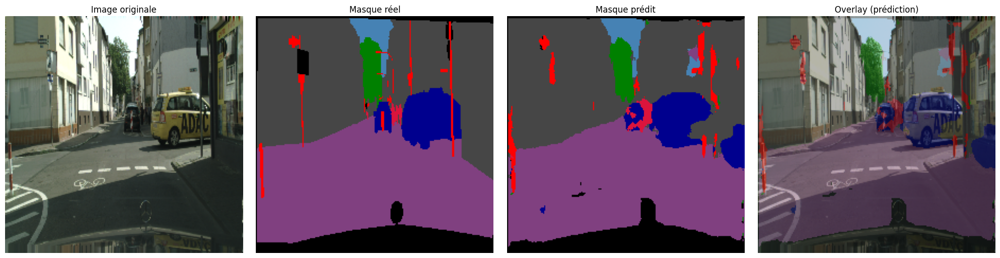

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step


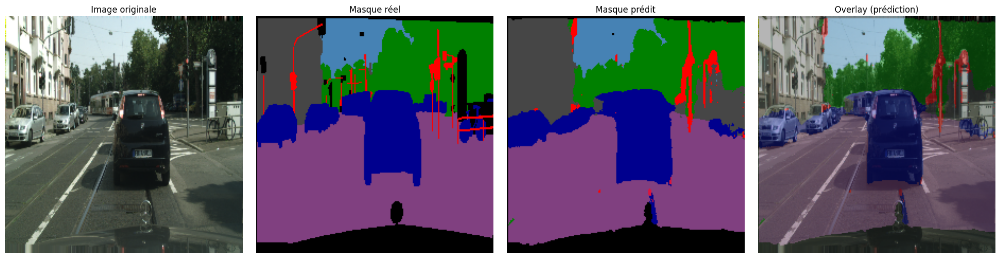

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


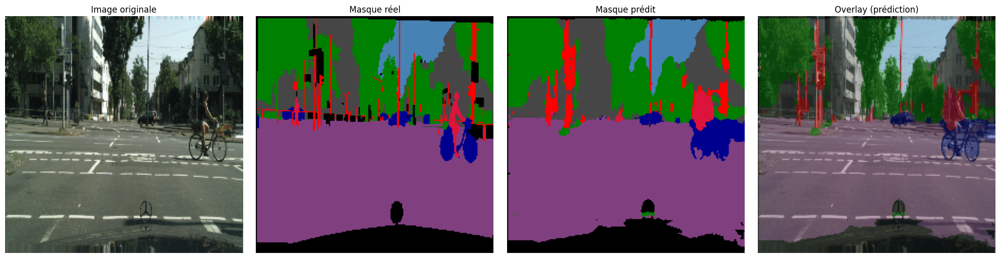

In [ ]:
# Reconstruction du meilleur modèle Unet from scratch sans data augmentation via MLflow, avec les mêmes paramètres
filter=[64,128,256]
dropout_rate=0.3
optimizer='adam'
learning_rate=1e-5
loss='focal_dice'
model = build_unet(
        backbone='vgg16',
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

# Chargement des poids enregistrés de ce modèle
model_path=f"/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate1e-05_lossfocal_dice/best_weights.h5"
model.load_weights(model_path)

# Visualisation
visualize_prediction(model, val_generator_vgg16, num_images=3)


#### U-Net avec encodeur VGG16 avec Data Augmentation

-----------------------------------------------------------------------------
UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice
Epoch 1/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.3224 - iou_score: 0.1829 - loss: 1.1138
Epoch 1: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 1: val_loss improved from inf to 0.92642, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2737s 4s/step - accuracy: 0.3224 - iou_score: 0.1829 - loss: 1.1137 - val_accuracy: 0.4548 - val_iou_score: 0.2924 - val_loss: 0.9264 - learning_rate: 1.0000e-04
Epoch 2/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4601 - iou_score: 0.3087 - loss: 0.9105
Epoch 2: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 2: val_loss improved from 0.92642 to 0.91835, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2669s 4s/step - accuracy: 0.4601 - iou_score: 0.3087 - loss: 0.9105 - val_accuracy: 0.4602 - val_iou_score: 0.3009 - val_loss: 0.9184 - learning_rate: 1.0000e-04
Epoch 3/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4664 - iou_score: 0.3180 - loss: 0.9015
Epoch 3: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 3: val_loss improved from 0.91835 to 0.90815, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2681s 4s/step - accuracy: 0.4664 - iou_score: 0.3180 - loss: 0.9015 - val_accuracy: 0.4644 - val_iou_score: 0.3119 - val_loss: 0.9082 - learning_rate: 1.0000e-04
Epoch 4/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5176 - iou_score: 0.3526 - loss: 0.8356
Epoch 4: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 4: val_loss improved from 0.90815 to 0.34205, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2671s 4s/step - accuracy: 0.5178 - iou_score: 0.3527 - loss: 0.8354 - val_accuracy: 0.8719 - val_iou_score: 0.6174 - val_loss: 0.3421 - learning_rate: 1.0000e-04
Epoch 5/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8833 - iou_score: 0.6472 - loss: 0.2985
Epoch 5: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 5: val_loss improved from 0.34205 to 0.27764, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2690s 4s/step - accuracy: 0.8833 - iou_score: 0.6472 - loss: 0.2985 - val_accuracy: 0.8789 - val_iou_score: 0.6493 - val_loss: 0.2776 - learning_rate: 1.0000e-04
Epoch 6/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8936 - iou_score: 0.6747 - loss: 0.2559
Epoch 6: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 6: val_loss improved from 0.27764 to 0.26264, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2667s 4s/step - accuracy: 0.8936 - iou_score: 0.6747 - loss: 0.2559 - val_accuracy: 0.8864 - val_iou_score: 0.6627 - val_loss: 0.2626 - learning_rate: 1.0000e-04
Epoch 7/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8974 - iou_score: 0.6883 - loss: 0.2395
Epoch 7: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 7: val_loss improved from 0.26264 to 0.25550, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2662s 4s/step - accuracy: 0.8974 - iou_score: 0.6883 - loss: 0.2395 - val_accuracy: 0.8888 - val_iou_score: 0.6695 - val_loss: 0.2555 - learning_rate: 1.0000e-04
Epoch 8/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9005 - iou_score: 0.6956 - loss: 0.2307
Epoch 8: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 8: val_loss improved from 0.25550 to 0.24686, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2712s 4s/step - accuracy: 0.9005 - iou_score: 0.6956 - loss: 0.2307 - val_accuracy: 0.8905 - val_iou_score: 0.6766 - val_loss: 0.2469 - learning_rate: 1.0000e-04
Epoch 9/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9020 - iou_score: 0.7010 - loss: 0.2253
Epoch 9: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 9: val_loss improved from 0.24686 to 0.24248, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2695s 4s/step - accuracy: 0.9020 - iou_score: 0.7010 - loss: 0.2253 - val_accuracy: 0.8923 - val_iou_score: 0.6811 - val_loss: 0.2425 - learning_rate: 1.0000e-04
Epoch 10/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9052 - iou_score: 0.7058 - loss: 0.2207
Epoch 10: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 10: val_loss improved from 0.24248 to 0.24106, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2725s 4s/step - accuracy: 0.9052 - iou_score: 0.7058 - loss: 0.2207 - val_accuracy: 0.8931 - val_iou_score: 0.6823 - val_loss: 0.2411 - learning_rate: 1.0000e-04
Epoch 11/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9064 - iou_score: 0.7117 - loss: 0.2146
Epoch 11: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 11: val_loss improved from 0.24106 to 0.24078, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2708s 4s/step - accuracy: 0.9064 - iou_score: 0.7117 - loss: 0.2146 - val_accuracy: 0.8927 - val_iou_score: 0.6830 - val_loss: 0.2408 - learning_rate: 1.0000e-04
Epoch 12/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9073 - iou_score: 0.7153 - loss: 0.2109
Epoch 12: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 12: val_loss improved from 0.24078 to 0.23690, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2728s 4s/step - accuracy: 0.9073 - iou_score: 0.7153 - loss: 0.2109 - val_accuracy: 0.8947 - val_iou_score: 0.6875 - val_loss: 0.2369 - learning_rate: 1.0000e-04
Epoch 13/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9085 - iou_score: 0.7192 - loss: 0.2067
Epoch 13: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 13: val_loss improved from 0.23690 to 0.23426, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2666s 4s/step - accuracy: 0.9085 - iou_score: 0.7192 - loss: 0.2067 - val_accuracy: 0.8952 - val_iou_score: 0.6894 - val_loss: 0.2343 - learning_rate: 1.0000e-04
Epoch 14/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9113 - iou_score: 0.7244 - loss: 0.2020
Epoch 14: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 14: val_loss did not improve from 0.23426
743/743 ━━━━━━━━━━━━━━━━━━━━ 2658s 4s/step - accuracy: 0.9113 - iou_score: 0.7244 - loss: 0.2020 - val_accuracy: 0.8950 - val_iou_score: 0.6854 - val_loss: 0.2385 - learning_rate: 1.0000e-04
Epoch 15/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9120 - iou_score: 0.7248 - loss: 0.2017
Epoch 15: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 15: val_loss improved from 0.23426 to 0.23131, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2697s 4s/step - accuracy: 0.9120 - iou_score: 0.7248 - loss: 0.2017 - val_accuracy: 0.8962 - val_iou_score: 0.6915 - val_loss: 0.2313 - learning_rate: 1.0000e-04
Epoch 16/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9136 - iou_score: 0.7322 - loss: 0.1946
Epoch 16: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 16: val_loss improved from 0.23131 to 0.22909, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2735s 4s/step - accuracy: 0.9136 - iou_score: 0.7322 - loss: 0.1946 - val_accuracy: 0.8965 - val_iou_score: 0.6938 - val_loss: 0.2291 - learning_rate: 1.0000e-04
Epoch 17/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9127 - iou_score: 0.7334 - loss: 0.1928
Epoch 17: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 17: val_loss improved from 0.22909 to 0.22685, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2673s 4s/step - accuracy: 0.9127 - iou_score: 0.7334 - loss: 0.1928 - val_accuracy: 0.8980 - val_iou_score: 0.6958 - val_loss: 0.2268 - learning_rate: 1.0000e-04
Epoch 18/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9119 - iou_score: 0.7313 - loss: 0.1950
Epoch 18: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 18: val_loss did not improve from 0.22685
743/743 ━━━━━━━━━━━━━━━━━━━━ 2693s 4s/step - accuracy: 0.9119 - iou_score: 0.7313 - loss: 0.1950 - val_accuracy: 0.8978 - val_iou_score: 0.6931 - val_loss: 0.2305 - learning_rate: 1.0000e-04
Epoch 19/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9155 - iou_score: 0.7361 - loss: 0.1911
Epoch 19: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 19: val_loss improved from 0.22685 to 0.22646, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2701s 4s/step - accuracy: 0.9155 - iou_score: 0.7361 - loss: 0.1911 - val_accuracy: 0.8970 - val_iou_score: 0.6965 - val_loss: 0.2265 - learning_rate: 1.0000e-04
Epoch 20/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9153 - iou_score: 0.7370 - loss: 0.1900
Epoch 20: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 20: val_loss did not improve from 0.22646
743/743 ━━━━━━━━━━━━━━━━━━━━ 2686s 4s/step - accuracy: 0.9153 - iou_score: 0.7370 - loss: 0.1900 - val_accuracy: 0.8978 - val_iou_score: 0.6940 - val_loss: 0.2294 - learning_rate: 1.0000e-04
Epoch 21/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9142 - iou_score: 0.7396 - loss: 0.1874
Epoch 21: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 21: val_loss improved from 0.22646 to 0.22460, saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5


743/743 ━━━━━━━━━━━━━━━━━━━━ 2721s 4s/step - accuracy: 0.9142 - iou_score: 0.7396 - loss: 0.1874 - val_accuracy: 0.8991 - val_iou_score: 0.6989 - val_loss: 0.2246 - learning_rate: 1.0000e-04
Epoch 22/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9184 - iou_score: 0.7451 - loss: 0.1824
Epoch 22: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 22: val_loss did not improve from 0.22460
743/743 ━━━━━━━━━━━━━━━━━━━━ 2746s 4s/step - accuracy: 0.9184 - iou_score: 0.7451 - loss: 0.1824 - val_accuracy: 0.8986 - val_iou_score: 0.6987 - val_loss: 0.2255 - learning_rate: 1.0000e-04
Epoch 23/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9172 - iou_score: 0.7432 - loss: 0.1839
Epoch 23: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 23: val_loss did not improve from 0.22460
743/743 ━━━━━━━━━━━━━━━━━━━━ 2691s 4s/step - accuracy: 0.9172 - iou_score: 0.7432 - loss: 0.1839 - val_accuracy: 0.8984 - val_iou_score: 0.6973 - val_loss: 0.2266 - learning_rate: 1.0000e-04
Epoch 24/50
743/743 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9180 - iou_score: 0.7436 - loss: 0.1838
Epoch 24: saving model to /content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/last_weights.h5



Epoch 24: val_loss did not improve from 0.22460
743/743 ━━━━━━━━━━━━━━━━━━━━ 2686s 4s/step - accuracy: 0.9180 - iou_score: 0.7436 - loss: 0.1838 - val_accuracy: 0.8994 - val_iou_score: 0.6981 - val_loss: 0.2248 - learning_rate: 1.0000e-04


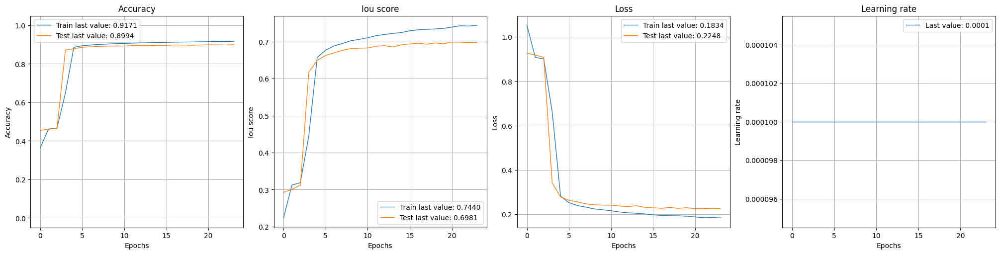

62/62 ━━━━━━━━━━━━━━━━━━━━ 310s 5s/step


2025/06/09 07:21:55 WARNING mlflow.tensorflow: You are saving a TensorFlow Core model or Keras model without a signature. Inference with mlflow.pyfunc.spark_udf() will not work unless the model's pyfunc representation accepts pandas DataFrames as inference inputs.
2025/06/09 07:22:20 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: /tmp/tmp7ltt4ot5/model, flavor: tensorflow). Fall back to return ['tensorflow==2.18.0', 'cloudpickle==3.1.1']. Set logging level to DEBUG to see the full traceback. 
2025/06/09 07:22:20 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'UNET_backboneVGG16_UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice' already exists. Creating a new version of this model...
Created version '2' of model 'U

Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.


<Figure size 640x480 with 0 Axes>

In [ ]:
# Hyperparamètres à tester
# filters=[[32,64],[64,128],[64,128,256]]
# dropout_rate_list=[0.0,0.3,0.5]
# optimizer_list=['adam','sgd']
# learning_rate_list=[1e-3,1e-4]
# loss_list=['dice', 'categorical_crossentropy','focal','focal_dice']
filter=[64,128,256]
dropout_rate=0.3
learning_rate=1e-4
optimizer='adam'
loss='focal_dice'

best_val_iou = 0
epochs_total = 50

# Créer un dossier pour sauvegarder les checkpoints
checkpoint_dir_base = "/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints"
os.makedirs(checkpoint_dir_base, exist_ok=True)

# for  learning_rate in learning_rate_list:
    # Nom de la run + checkpoint
run_name = f"UNET_epoch50_backboneVGG16_AUG_filter{filter}_dropout_rate{dropout_rate}_optimizer{optimizer}_learning_rate{learning_rate}_loss{loss}"
run_checkpoint_dir = os.path.join(checkpoint_dir_base, run_name)
os.makedirs(run_checkpoint_dir, exist_ok=True)

path_last = os.path.join(run_checkpoint_dir, "last_weights.h5")
path_best = os.path.join(run_checkpoint_dir, "best_weights.h5")
path_epoch = os.path.join(run_checkpoint_dir, "epoch.json")

# Créer le modèle
model = build_unet(
    backbone='vgg16',
    input_shape=(224, 224, 3),
    num_classes=8,
    filters=filter,
    dropout_rate=dropout_rate,
    optimizer=optimizer,
    learning_rate=learning_rate,
    loss=loss
)

# Si un checkpoint existe, reprendre
initial_epoch = 0
if os.path.exists(path_last):
    model.load_weights(path_last)
    if os.path.exists(path_epoch):
        with open(path_epoch, "r") as f:
            epoch_data = json.load(f)
            initial_epoch = epoch_data.get("epoch", 0) + 1
    print(f"[INFO] Reprise depuis epoch {initial_epoch}")

# Enregistrement avec MLflow
with mlflow.start_run(experiment_id='364163698965296690', run_name=run_name):
    mlflow.log_param("filter", filter)
    mlflow.log_param("dropout_rate", dropout_rate)
    mlflow.log_param("optimizer", optimizer)
    mlflow.log_param("learning_rate", learning_rate)
    mlflow.log_param("loss", loss)

    class EpochSaver(tf.keras.callbacks.Callback):
        def on_epoch_end(self, epoch, logs=None):
            with open(path_epoch, "w") as f:
                json.dump({"epoch": epoch}, f)

    # Checkpoint qui sauvegarde le meilleur modèle (selon val_loss)
    checkpoint_last = ModelCheckpoint(path_last, save_best_only=False, verbose=1)
    checkpoint_best = ModelCheckpoint(path_best, monitor='val_loss', save_best_only=True, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3)

    callbacks_list = [checkpoint_last, checkpoint_best, early_stopping, reduce_lr, EpochSaver()]

    print("-----------------------------------------------------------------------------")
    print(f"{run_name}")

    history = model.fit(
        train_generator_aug_vgg16,
        validation_data=val_generator_vgg16,
        epochs=epochs_total,
        initial_epoch=initial_epoch,
        callbacks=callbacks_list
    )

    # Charge les meilleurs poids avant test
    model.load_weights(path_best)

    # Courbe d'entrainement et de validation
    if history.history.get("loss"):  # Vérifie qu'on a des données
        show_history(history)
        plot_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{run_name}.png"
        plot_history(history, path=plot_path)
        mlflow.log_artifact(plot_path)
        plt.close()
        # Journalisation des métriques dans MLflow
        mlflow.log_metric("final_train_accuracy", history.history['accuracy'][-1])
        mlflow.log_metric("final_val_accuracy", history.history['val_accuracy'][-1])
        mlflow.log_metric("final_train_loss", history.history['loss'][-1])
        mlflow.log_metric("final_val_loss", history.history['val_loss'][-1])
    else:
        print("[INFO] Aucun nouvel entraînement effectué, courbes non générées.")

    # Évaluation
    scores = model.evaluate(val_generator_vgg16, verbose=0)
    val_iou = scores[1]

    mlflow.log_metric("test_loss", scores[0])
    mlflow.log_metric("test_iou", scores[1])
    mlflow.log_metric("test_accuracy", scores[2])

    # Réinitialisation du générateur si nécessaire
    val_generator_vgg16.on_epoch_end()
    # test_generator.reset()

    # Prédictions
    y_pred = model.predict(val_generator_vgg16)
    y_pred_classes = np.argmax(y_pred, axis=-1)

    # Vérités terrain
    y_true = []
    for i in range(len(val_generator_vgg16)):
        _, batch_y = val_generator_vgg16[i]
        y_true.append(batch_y)
    y_true = np.concatenate(y_true, axis=0)
    y_true_classes = np.argmax(y_true, axis=-1)

    # Aplatir les tableaux
    y_pred_flat = y_pred_classes.flatten()
    y_true_flat = y_true_classes.flatten()

    # Calculs des IoU
    iou_per_class = jaccard_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)), zero_division=0)
    mean_iou = jaccard_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)), zero_division=0)
    weighted_iou = jaccard_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)), zero_division=0)

    # Log dans MLflow
    for i, iou in enumerate(iou_per_class):
        mlflow.log_metric(f"iou_class_{i}", iou)
    mlflow.log_metric("mean_iou_macro", mean_iou)
    mlflow.log_metric("mean_iou_weighted", weighted_iou)

    # --- Dice global : sur tous les pixels ---
    dice_global = f1_score(y_true_flat, y_pred_flat, average='micro', labels=list(range(8)))
    mlflow.log_metric("dice_global", dice_global)

    # --- Dice macro : moyenne simple sur les classes ---
    dice_macro = f1_score(y_true_flat, y_pred_flat, average='macro', labels=list(range(8)))
    mlflow.log_metric("dice_macro", dice_macro)

    # --- Dice pondéré : moyenne pondérée selon la fréquence des classes ---
    dice_weighted = f1_score(y_true_flat, y_pred_flat, average='weighted', labels=list(range(8)))
    mlflow.log_metric("dice_weighted", dice_weighted)

    # --- Dice par classe ---
    dice_per_class = f1_score(y_true_flat, y_pred_flat, average=None, labels=list(range(8)))
    for i, dice in enumerate(dice_per_class):
        mlflow.log_metric(f"dice_class_{i}", dice)

    # Matrice de confusion
    conf_matrix = confusion_matrix(y_true_flat, y_pred_flat, labels=range(8))
    plt.figure(figsize=(8,6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel("Prédictions")
    plt.ylabel("Réels")
    plt.title("Matrice de confusion")
    cm_path = f"/content/drive/MyDrive/Colab_Notebooks/P8/save/conf_matrix_{run_name}.png"
    plt.savefig(cm_path)
    mlflow.log_artifact(cm_path)
    plt.close()

    # Enregistrement du modèle
    mlflow.tensorflow.log_model(model, run_name)
    if val_iou > best_val_iou:
        best_val_iou = val_iou
        best_model_name = run_name
        model.save(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/{best_model_name}.h5")
        plt.savefig(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")
        mlflow.log_artifact(f"/content/drive/MyDrive/Colab_Notebooks/P8/save/confusion_matrix_{best_model_name}.png")

    model_uri = f"runs:/{mlflow.active_run().info.run_id}/UNET_backboneVGG16"
    mlflow.register_model(model_uri=model_uri, name=f"UNET_backboneVGG16_{run_name}")

    client = MlflowClient()
    latest_version = client.get_latest_versions(f"UNET_backboneVGG16_{run_name}", stages=[])[-1]

    # Ajouter une description lisible
    client.update_model_version(
        name=f"UNET_backboneVGG16_{run_name}",
        version=latest_version.version,
        description=f"IOU: {val_iou:.3f} | {datetime.today().date()}"
    )

    # Ajouter des tags utiles
    client.set_model_version_tag(
        name=f"UNET_backboneVGG16_{run_name}",
        version=latest_version.version,
        key="IOU",
        value=str(round(val_iou, 3))
    )

    client.transition_model_version_stage(
        name=f"UNET_backboneVGG16_{run_name}",
        version=latest_version.version,
        stage="Staging"
    )

print("Tests d'hyperparamètres terminés et métriques enregistrées dans MLflow.")


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


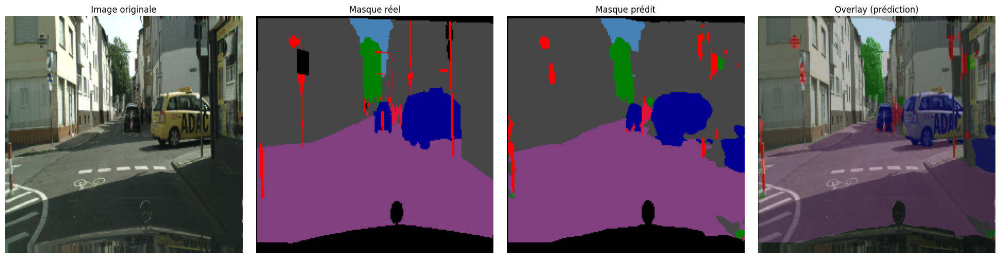

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step


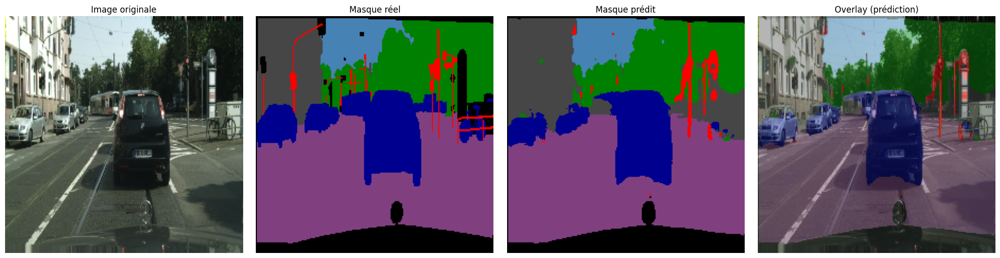

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


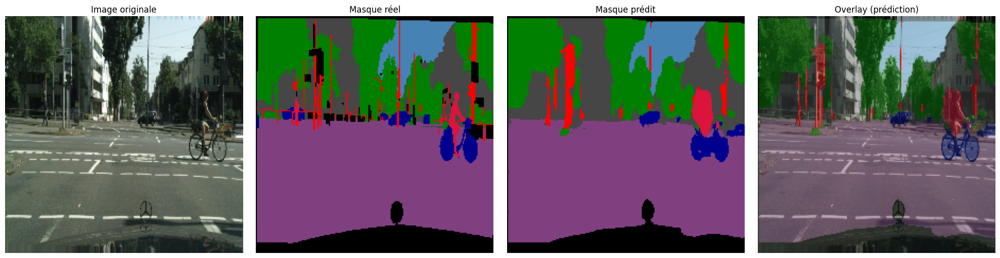

In [ ]:
# Reconstruction du meilleur modèle Unet from scratch sans data augmentation via MLflow, avec les mêmes paramètres
filter=[64,128,256]
dropout_rate=0.3
optimizer='adam'
learning_rate=1e-4
loss='focal_dice'
model = build_unet(
        backbone='vgg16',
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

# Chargement des poids enregistrés de ce modèle
model_path=f"/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5"
model.load_weights(model_path)

# Visualisation
visualize_prediction(model, val_generator_vgg16, num_images=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


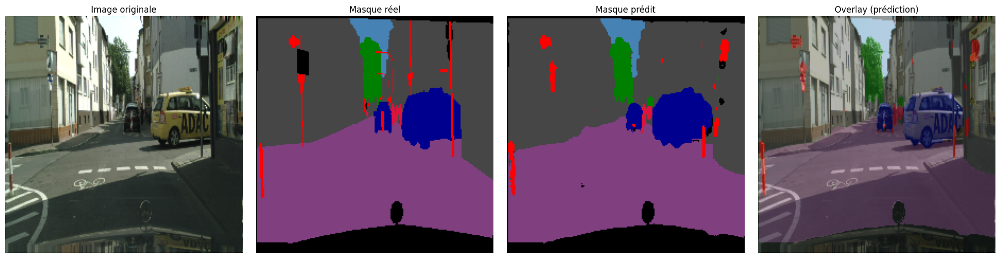

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


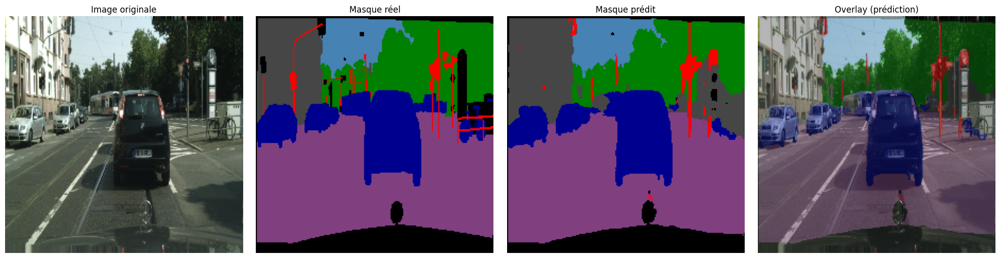

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


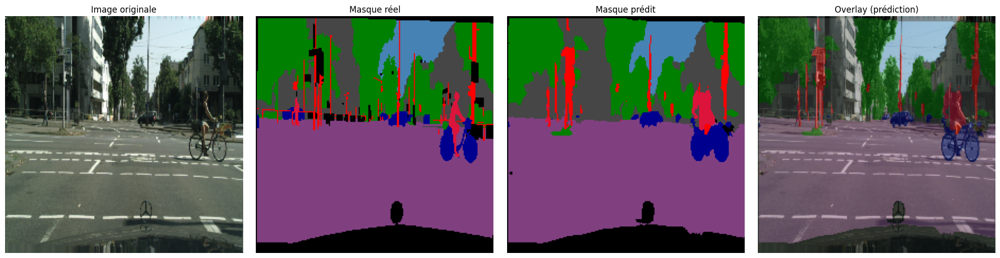

In [ ]:
# Reconstruction du meilleur modèle Unet from scratch sans data augmentation via MLflow, avec les mêmes paramètres, après entrainement complet sur 50 epochs
filter=[64,128,256]
dropout_rate=0.3
optimizer='adam'
learning_rate=1e-4
loss='focal_dice'
model = build_unet(
        backbone='vgg16',
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=filter,
        dropout_rate=dropout_rate,
        optimizer=optimizer,
        learning_rate=learning_rate,
        loss=loss
    )

# Chargement des poids enregistrés de ce modèle
model_path=f"/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5"
model.load_weights(model_path)

# Visualisation
visualize_prediction(model, val_generator_vgg16, num_images=3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


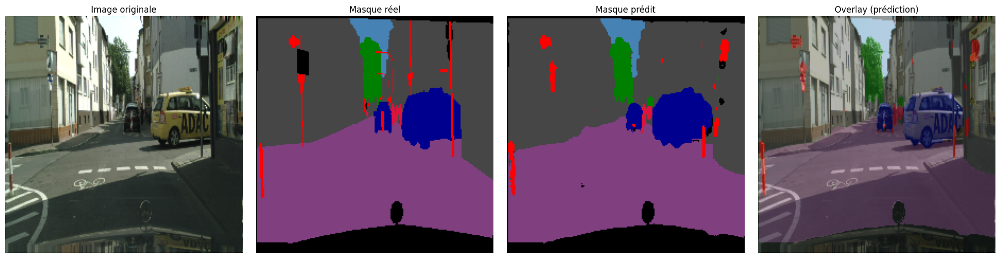

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step


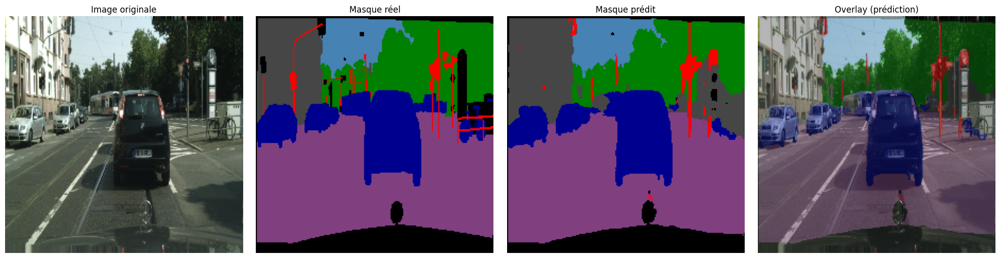

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


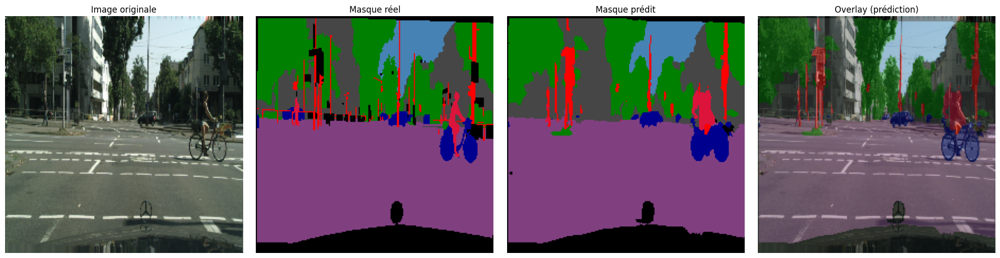

In [ ]:
model_test = build_unet(
        backbone='vgg16',
        input_shape=(224, 224, 3),
        num_classes=8,
        filters=[64, 128, 256],
        dropout_rate=0.3,
        optimizer='adam',
        learning_rate=1e-4,
        loss='focal_dice'
    )

    # Charge les poids dans le modèle
model_test.load_weights("/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/best_weights.h5")
visualize_prediction(model_test, val_generator_vgg16, num_images=3)

In [ ]:
import shutil

# Étape 1 : créer l'archive ZIP dans /content
shutil.make_archive("/content/mlruns", 'zip', "/content/drive/MyDrive/Colab_Notebooks/P8/save/mlruns")

# Étape 2 : copier le zip dans Google Drive
shutil.move("/content/mlruns.zip", "/content/drive/MyDrive/Colab_Notebooks/P8/mlruns.zip")

# Télécharger en local
from google.colab import files
files.download("/content/drive/MyDrive/Colab_Notebooks/P8/mlruns.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from pyngrok import ngrok, conf

# Indiquer manuellement le chemin vers le binaire ngrok
conf.get_default().ngrok_path = "C:/tutorial-env/ngrok.exe"

# Authentifier avec ton token
ngrok.set_auth_token("2waHSDEITs7Xn3gcB3stogIL4Ho_795MuQhFYDULrxjMPzNBJ")

mlflow_process = subprocess.Popen(
    ["mlflow", "ui", "--port", "5000", "--backend-store-uri", "file:///C:/tutorial-env/OCR/Projet8/mlruns"],
    stdout=subprocess.PIPE,
    stderr=subprocess.PIPE,
)

def print_stdout(proc):
    for line in proc.stdout:
        print("[MLFLOW STDOUT]", line.decode(), end="")

def print_stderr(proc):
    for line in proc.stderr:
        print("[MLFLOW STDERR]", line.decode(), end="")

threading.Thread(target=print_stdout, args=(mlflow_process,), daemon=True).start()
threading.Thread(target=print_stderr, args=(mlflow_process,), daemon=True).start()


# Tunnel avec ngrok vers ce port
time.sleep(5)  # Laisse le temps à mlflow de se lancer
public_url = ngrok.connect(5000)
print(f"MLflow UI est accessible ici : {public_url}")

[MLFLOW STDERR] INFO:waitress:Serving on http://127.0.0.1:5000
MLflow UI est accessible ici : NgrokTunnel: "https://bf0c-2001-861-2ce0-9820-dd92-38ae-1ebe-6f80.ngrok-free.app" -> "http://localhost:5000"


D'après les résultats visualisés sur MLflow, ce sont les modèles UNET avec encodeur pré-entrainés VGG16 et une data augmentation qui obtiennent les meilleurs mean_iou_weighted, notre métrique prioritaire.
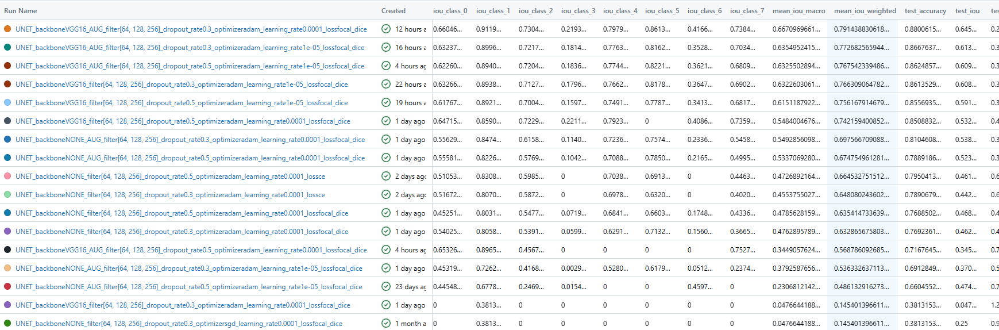

Le meilleur modèle est celui avec encodeur pré-entrainé VGG16 et les paramètres suivants:
- avec data augmentation
- taux de drop-out de 0,3
- taux d'apprentissage de 0,0001.

Un entrainement complet, c'est à dire sur 50 epochs, sera effectué pour le déployer après sur l'API.

Les résultats après l'entrainement complet sont :     
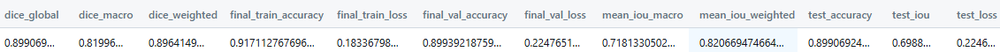

***Script pour charger le modele dans le container AZURE***

In [ ]:
pip install azure-storage-blob

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.0/407.0 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.4/207.4 kB 17.2 MB/s eta 0:00:00


In [ ]:
#  Script pour charger le modèle dans le blob azure
from azure.storage.blob import BlobServiceClient, ContentSettings
import os

# Chaîne de connexion à ton compte de stockage Azure
AZURE_STORAGE_CONNECTION_STRING = "DefaultEndpointsProtocol=https;AccountName=stockaccountp8;AccountKey=flae3B4NIMDm7xc1N3pmP84VgN+zqnM0+HsGw/Y+OqhfomqVLftO9jy4J5r2aIn+eccsB1G8A147+AStRvQ6TA==;EndpointSuffix=core.windows.net"

# Paramètres
container_name = "projet8"  # le nom du container que tu as créé sur Azure
LOCAL_MODEL_DIR = "/content/drive/MyDrive/Colab_Notebooks/P8/checkpoints/UNET_epoch50_backboneVGG16_AUG_filter[64, 128, 256]_dropout_rate0.3_optimizeradam_learning_rate0.0001_lossfocal_dice/"
MODEL_FILENAME = 'best_weights.h5'
LOCAL_MODEL_PATH = os.path.join(LOCAL_MODEL_DIR, MODEL_FILENAME)
blob_name = "unet_vgg16_aug_epoch50_model.weights.h5"  # le nom que tu veux donner dans Azure

# Connexion au compte de stockage
blob_service_client = BlobServiceClient.from_connection_string(AZURE_STORAGE_CONNECTION_STRING)
blob_client = blob_service_client.get_blob_client(container=container_name, blob=blob_name)

# Upload
with open(LOCAL_MODEL_PATH, "rb") as data:
    blob_client.upload_blob(
        data,
        overwrite=True,
        content_settings=ContentSettings(content_type='application/octet-stream')
    )

print(f"✅ Modèle uploadé sous le nom {blob_name} dans le container {container_name}")


✅ Modèle uploadé sous le nom unet_vgg16_aug_epoch50_model.weights.h5 dans le container projet8
